In [1]:
import pandas as pd



In [ ]:

# Load the CSV file
file_path = 'C:/Proyectos/Elecciones-2024/CDMX_pres_aggregated.csv'  # Update with the correct file path
data = pd.read_csv(file_path)

# Define the coalitions
morena_coalition = ['PVEM', 'PT', 'MORENA', 'PVEM_PT_MORENA', 'PVEM_PT', 'PVEM_MORENA', 'PT_MORENA']
opposition_coalition = ['PAN', 'PRI', 'PRD', 'PAN_PRI_PRD', 'PAN_PRD', 'PAN_PRI', 'PRI_PRD']
others = ['MC', 'CANDIDATO/A NO REGISTRADO/A', 'VOTOS NULOS']

# Ensure all required columns are included in the aggregated data
required_columns = ['ID_ENTIDAD', 'ENTIDAD', 'ID_DISTRITO_FEDERAL', 'DISTRITO_FEDERAL', 'SECCION']
vote_columns = morena_coalition + opposition_coalition + others

# Aggregate vote columns by required columns
aggregated_data = data.groupby(required_columns)[vote_columns + ['TOTAL_VOTOS_CALCULADOS', 'LISTA_NOMINAL']].sum().reset_index()

# Sum votes for each coalition
aggregated_data['MORENA_COALITION_VOTES'] = aggregated_data[morena_coalition].sum(axis=1)
aggregated_data['OPPOSITION_COALITION_VOTES'] = aggregated_data[opposition_coalition].sum(axis=1)
aggregated_data['OTHERS_VOTES'] = aggregated_data[others].sum(axis=1)

# Calculate percentages for each coalition
aggregated_data['MORENA_COALITION_PERCENTAGE'] = (aggregated_data['MORENA_COALITION_VOTES'] / aggregated_data['TOTAL_VOTOS_CALCULADOS']) * 100
aggregated_data['OPPOSITION_COALITION_PERCENTAGE'] = (aggregated_data['OPPOSITION_COALITION_VOTES'] / aggregated_data['TOTAL_VOTOS_CALCULADOS']) * 100
aggregated_data['OTHERS_PERCENTAGE'] = (aggregated_data['OTHERS_VOTES'] / aggregated_data['TOTAL_VOTOS_CALCULADOS']) * 100

# Calculate participation
aggregated_data['PARTICIPATION_PERCENTAGE'] = (aggregated_data['TOTAL_VOTOS_CALCULADOS'] / aggregated_data['LISTA_NOMINAL']) * 100

# Display the final DataFrame
print(aggregated_data.head())

# Save the aggregated and calculated DataFrame to a CSV file
output_file_path = 'C:/Proyectos/Elecciones-2024/CDMX_pres_aggregated_coalition.csv'  # Update with the desired file path
aggregated_data.to_csv(output_file_path, index=False)

#print(f"Aggregated data saved to {output_file_path}")

In [ ]:
#Nacional

In [13]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Load the shapefile
shapefile_path = "C:/Proyectos/Elecciones-2024/data/shapefiles/CdMx Shp/SECCION_ELECTORAL.shp"  # Update with the correct file path
gdf = gpd.read_file(shapefile_path)

# Load the aggregated data
csv_file_path = 'C:/Proyectos/Elecciones-2024/CDMX_pres_aggregated_coalition.csv'   # Update with the correct file path
df = pd.read_csv(csv_file_path)

# Ensure the SECCION column is of the same type in both dataframes
gdf['SECCION'] = gdf['SECCIÓN'].astype(int)
df['SECCION'] = df['SECCION'].astype(int)



In [14]:
gdf.head()

,Name,ENTIDAD,CVE_DEM_T,DEMARCACI,DISTRITO,DISTRITO_L,SECCIÓN,POB_DEMARC,POB_X_SECC,LN_31dic20,name,geometry,SECCION
0,None,9,2.0,Azcapotzalco,3,3,191,432205.0,1346.0,1148,191,"POLYGON ((-99.19892 19.50038, -99.19927 19.499...",191
1,None,9,2.0,Azcapotzalco,3,3,192,432205.0,548.0,496,192,"POLYGON ((-99.20483 19.50183, -99.20475 19.501...",192
2,None,9,2.0,Azcapotzalco,3,3,193,432205.0,1747.0,1553,193,"POLYGON ((-99.21228 19.50241, -99.21219 19.502...",193
3,None,9,2.0,Azcapotzalco,3,3,194,432205.0,1956.0,1648,194,"POLYGON ((-99.20637 19.49819, -99.20613 19.498...",194
4,None,9,2.0,Azcapotzalco,3,3,195,432205.0,938.0,923,195,"POLYGON ((-99.20309 19.49785, -99.20303 19.497...",195


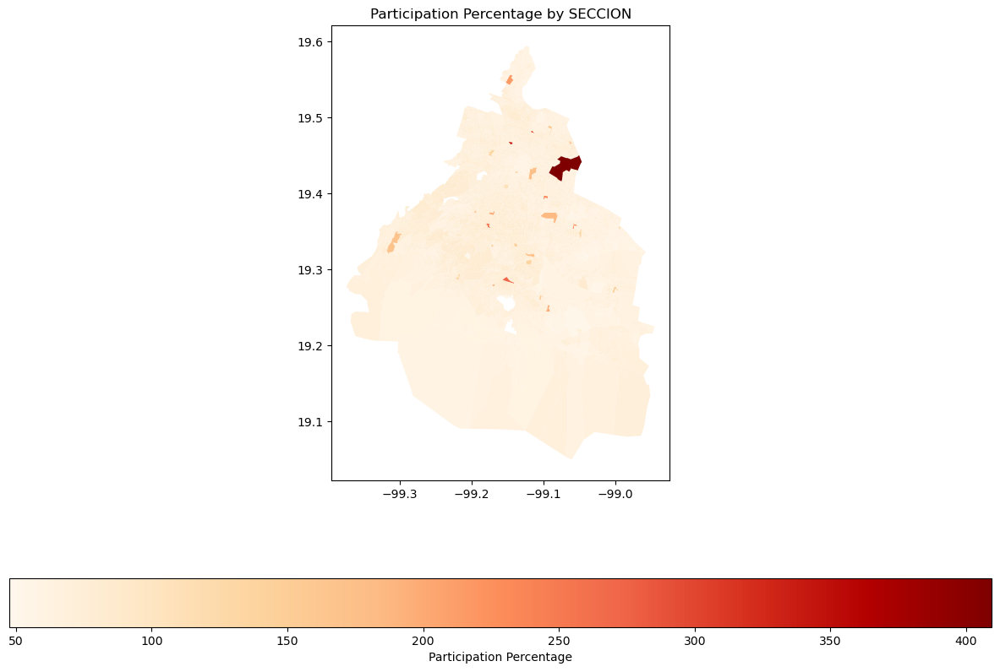

In [15]:

# Merge the GeoDataFrame with the DataFrame on the SECCION column
merged_gdf = gdf.merge(df, on='SECCION')

# Create a map for participation
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
merged_gdf.plot(column='PARTICIPATION_PERCENTAGE', ax=ax, legend=True,
                legend_kwds={'label': "Participation Percentage", 'orientation': "horizontal"},
                cmap='OrRd')
ax.set_title('Participation Percentage by SECCION')
plt.show()


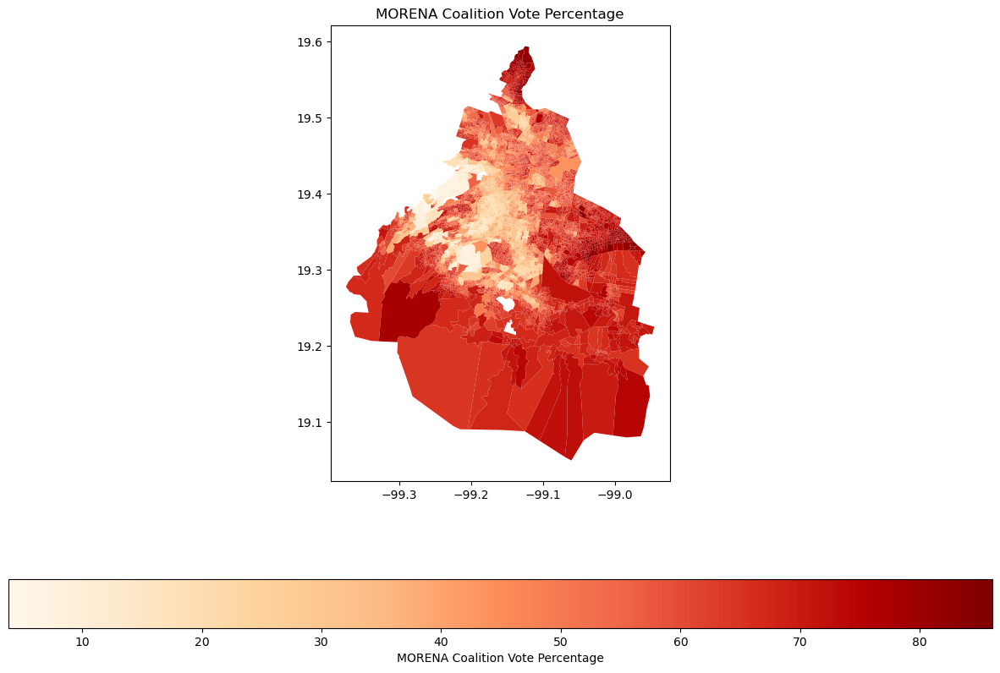

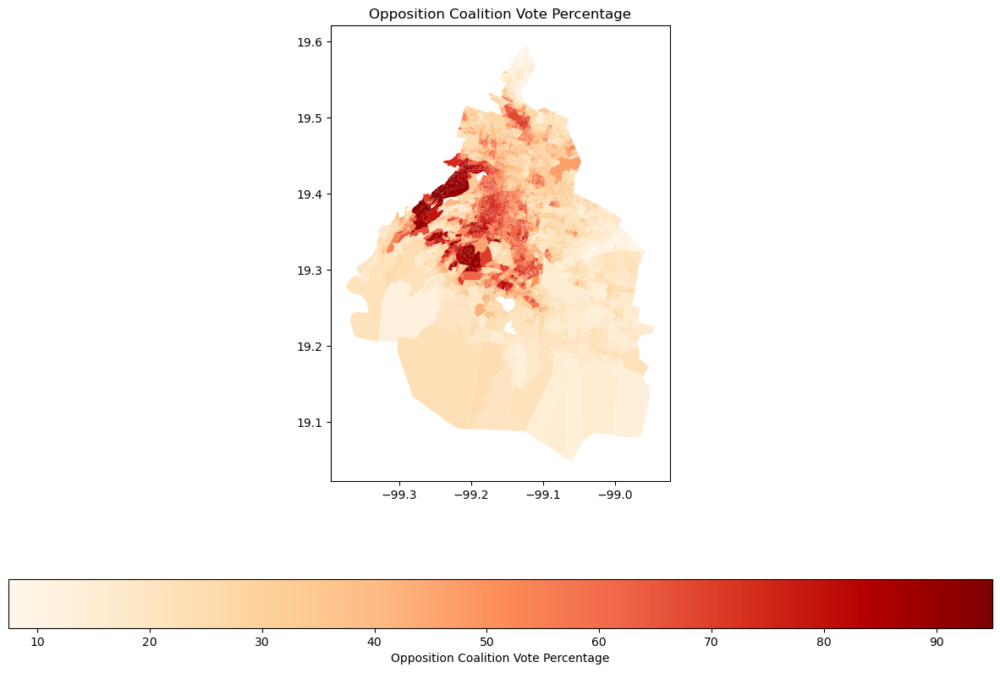

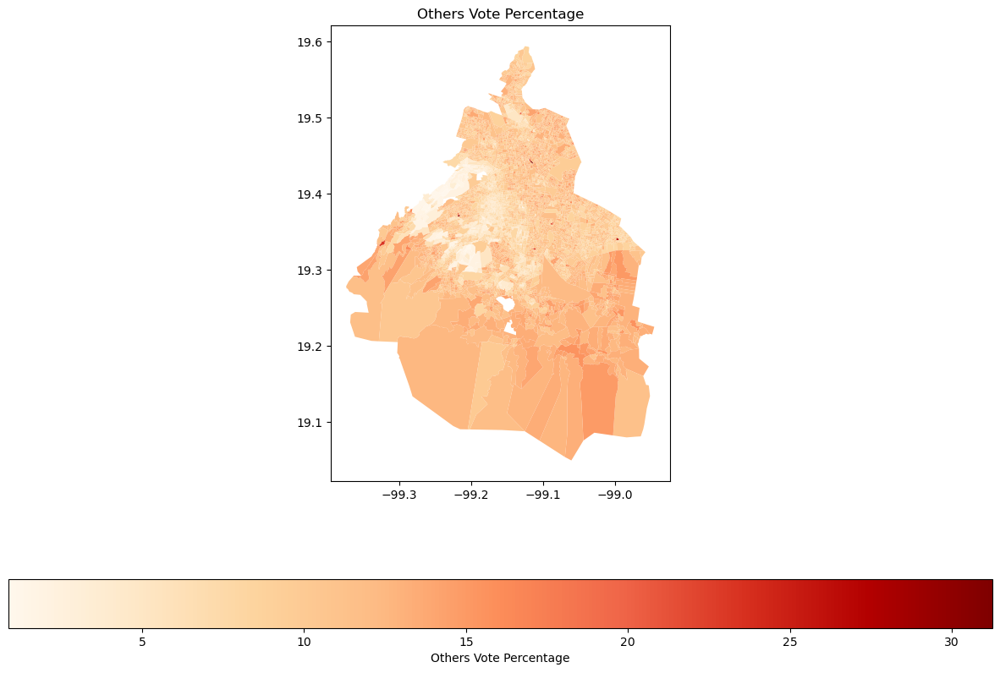

In [17]:

# Create maps for each coalition
coalitions = ['MORENA_COALITION_PERCENTAGE', 'OPPOSITION_COALITION_PERCENTAGE', 'OTHERS_PERCENTAGE']
titles = ['MORENA Coalition Vote Percentage', 'Opposition Coalition Vote Percentage', 'Others Vote Percentage']

for col, title in zip(coalitions, titles):
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))
    merged_gdf.plot(column=col, ax=ax, legend=True,
                    legend_kwds={'label': title, 'orientation': "horizontal"},
                    cmap='OrRd')
    ax.set_title(title)
    plt.show()

NameError: name 'pres' is not defined

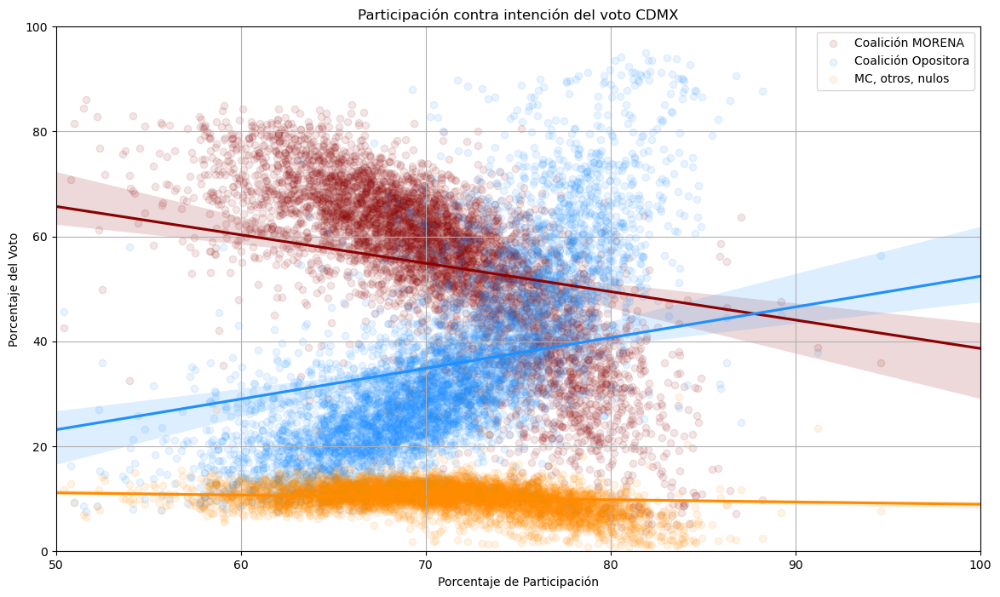

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting the data
plt.figure(figsize=(14, 8))

# MORENA Coalition
sns.regplot(x='PARTICIPATION_PERCENTAGE', y='MORENA_COALITION_PERCENTAGE', data=aggregated_data,
            scatter_kws={'color': 'darkred', 'alpha': 0.1}, line_kws={'color': 'darkred'}, label='Coalición MORENA')

# Opposition Coalition
sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OPPOSITION_COALITION_PERCENTAGE', data=aggregated_data,
            scatter_kws={'color': 'dodgerblue', 'alpha': 0.1}, line_kws={'color': 'dodgerblue'}, label='Coalición Opositora')

# Others
sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OTHERS_PERCENTAGE', data=aggregated_data,
            scatter_kws={'color': 'darkorange', 'alpha': 0.1}, line_kws={'color': 'darkorange'}, label='MC, otros, nulos')

# Setting labels and title
plt.xlabel('Porcentaje de Participación')
plt.ylabel('Porcentaje del Voto')
plt.title('Participación contra intención del voto CDMX')
plt.xlim(50, 100)  # Start the x-axis at 50
plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100
plt.legend()
plt.grid(True)

# Display the plot
plt.show()


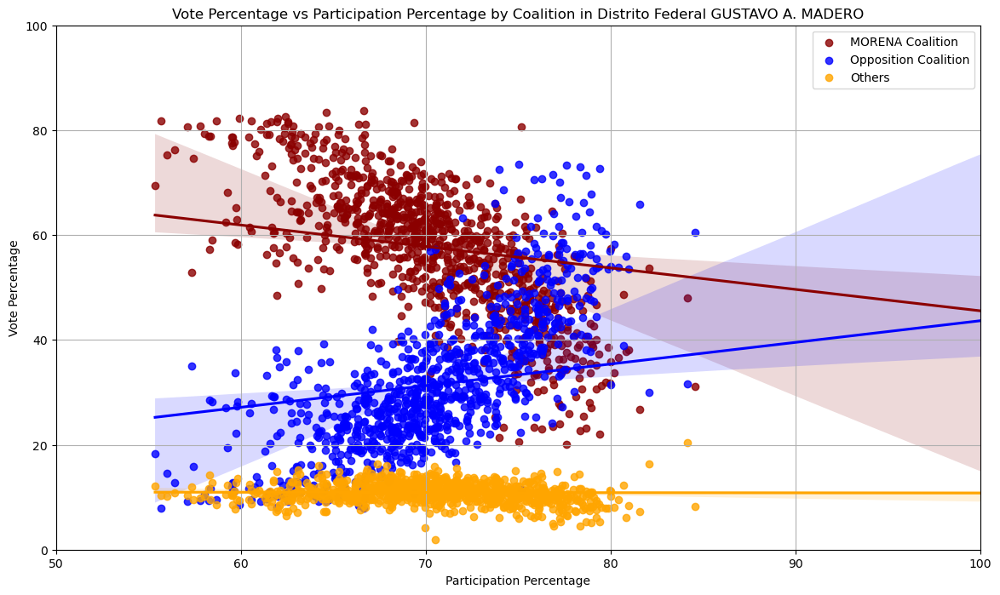

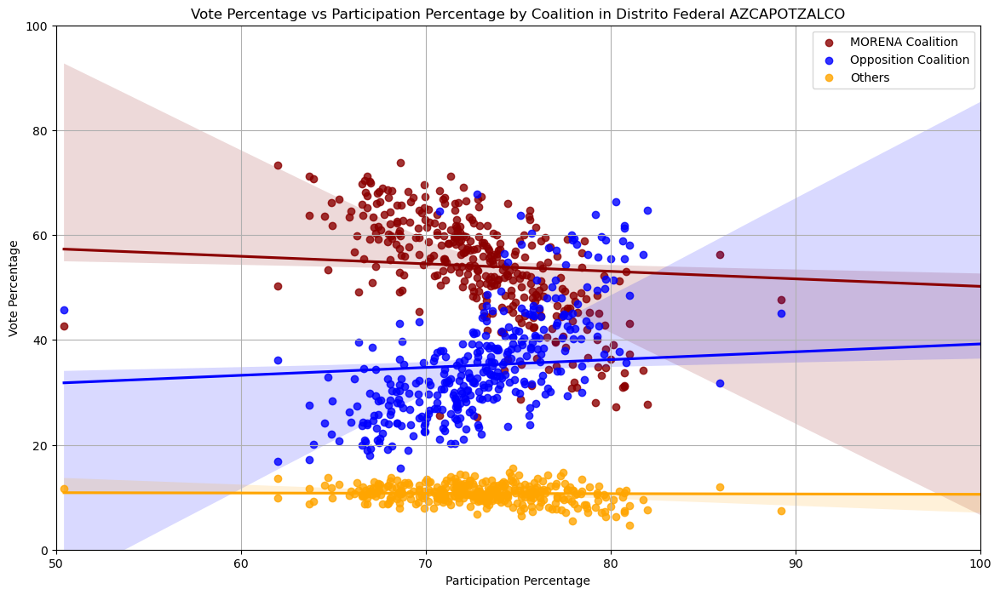

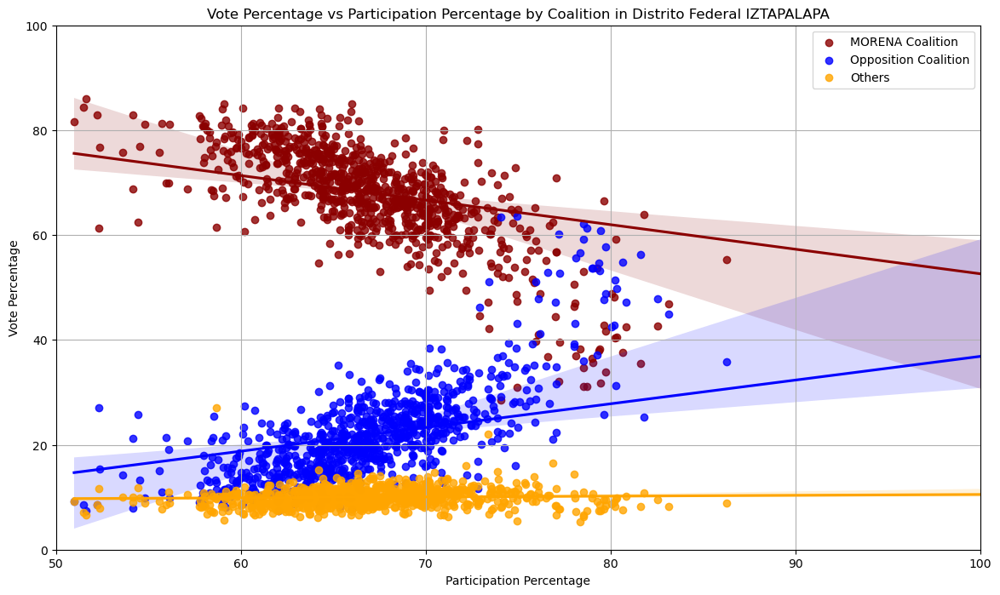

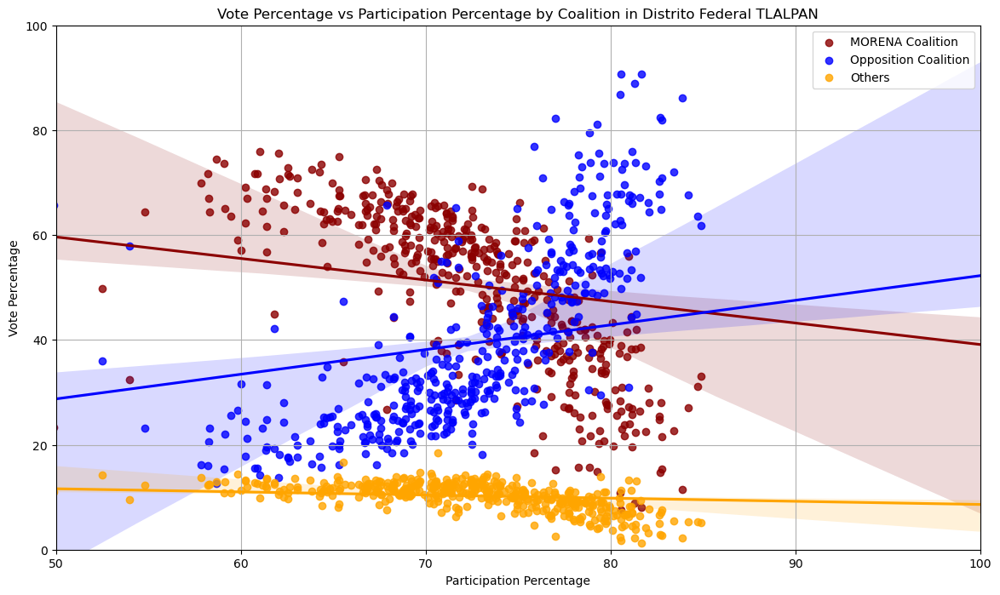

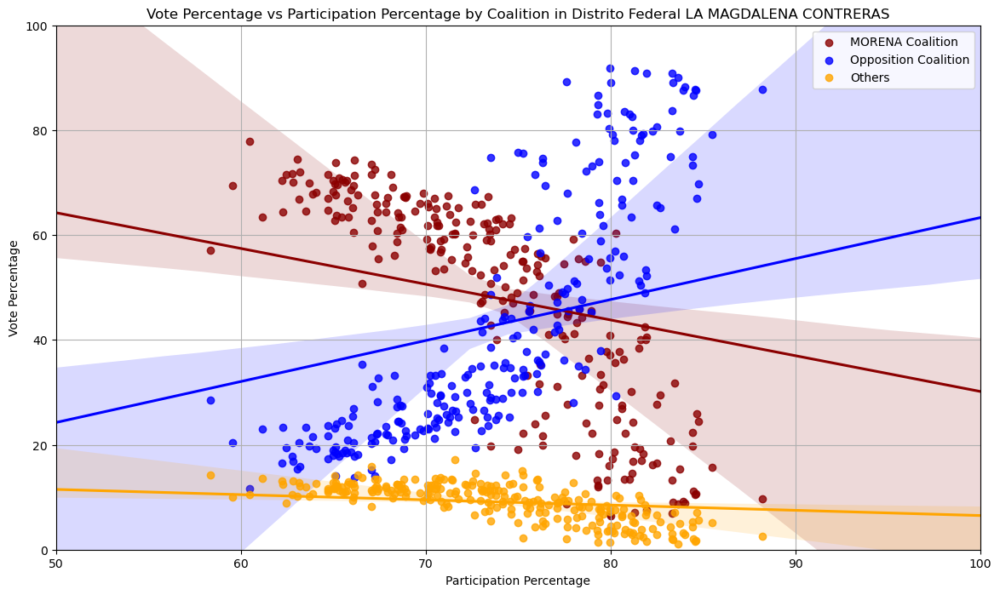

...

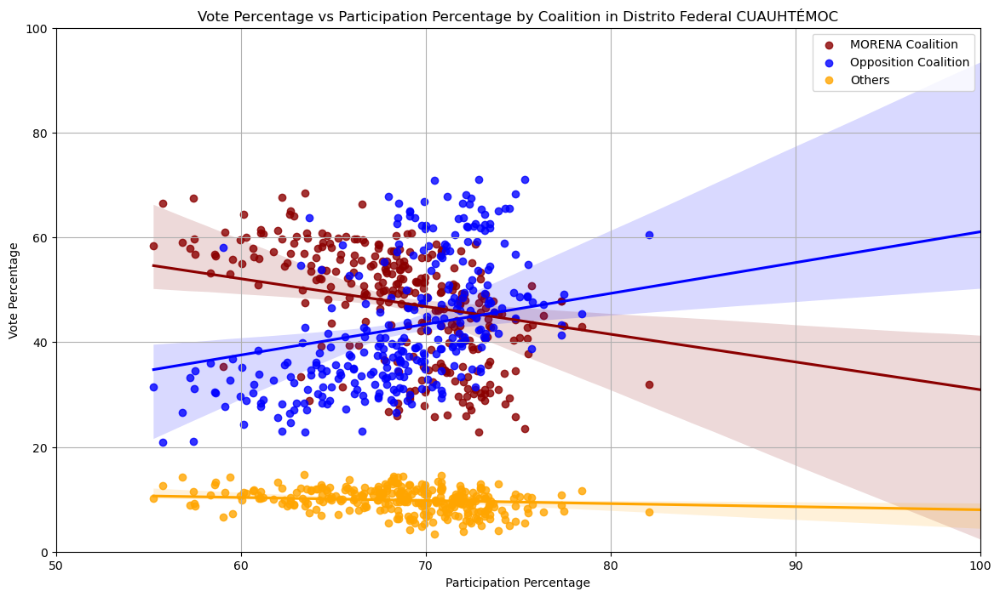

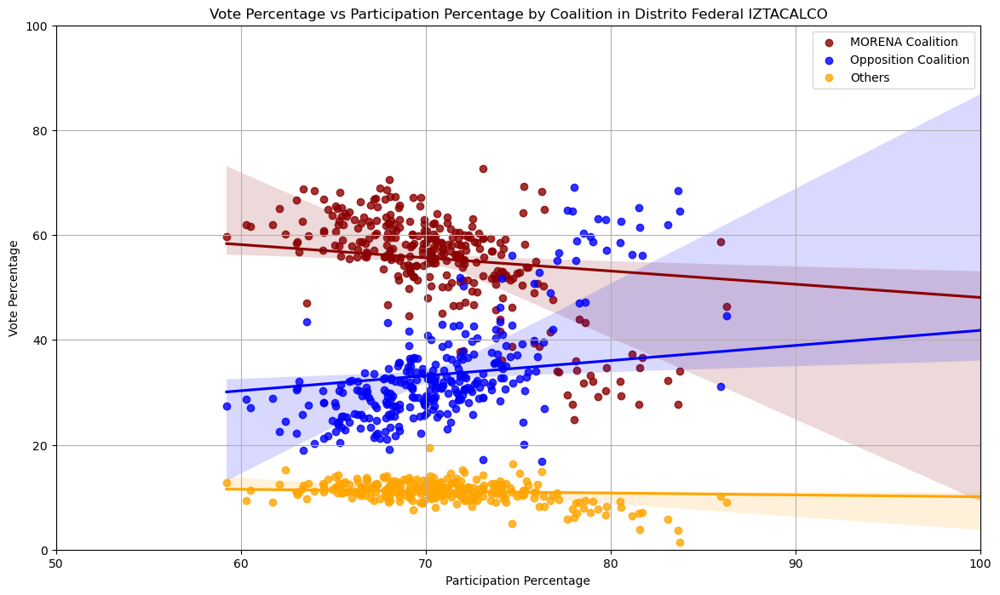

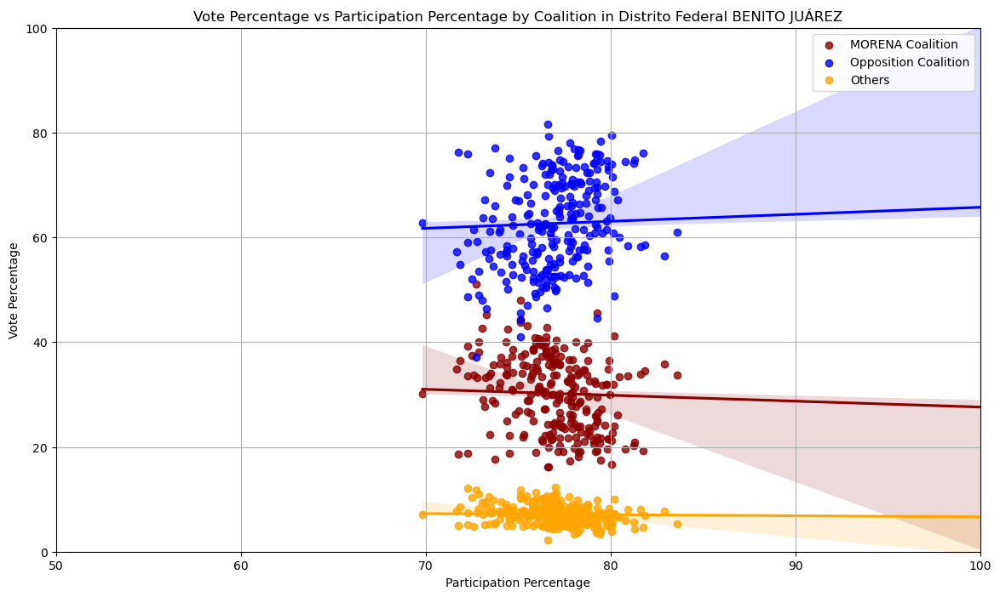

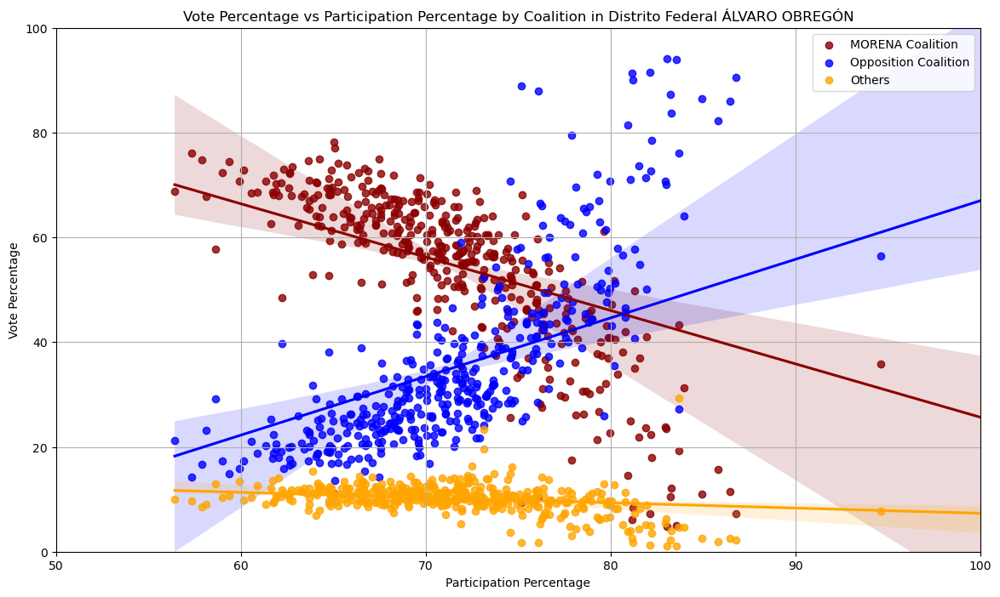

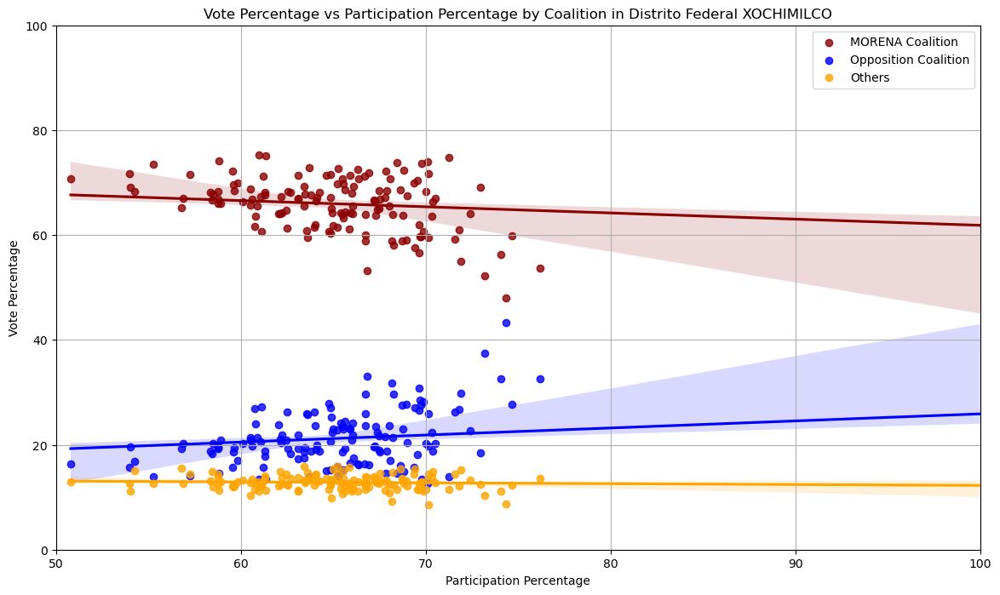

In [26]:
# Ensure DISTRITO_FEDERAL is in the data
if 'DISTRITO_FEDERAL' in aggregated_data.columns:
    unique_distritos = aggregated_data['DISTRITO_FEDERAL'].unique()

    for distrito in unique_distritos:
        subset_data = aggregated_data[aggregated_data['DISTRITO_FEDERAL'] == distrito]

        plt.figure(figsize=(14, 8))

        # MORENA Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='MORENA_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'darkred', 'alpha': 0.1}, line_kws={'color': 'darkred'}, label='MORENA Coalition')

        # Opposition Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OPPOSITION_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'blue', 'alpha': 0.1}, line_kws={'color': 'blue'}, label='Opposition Coalition')

        # Others
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OTHERS_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'orange', 'alpha': 0.1}, line_kws={'color': 'orange'}, label='Others')

        # Setting labels and title
        plt.xlabel('Participation Percentage')
        plt.ylabel('Vote Percentage')
        plt.title(f'Vote Percentage vs Participation Percentage by Coalition in Distrito Federal {distrito}')
        plt.xlim(50, 100)  # Start the x-axis at 50
        plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100
        plt.legend()
        plt.grid(True)

        # Display the plot
        plt.show()

else:
    print("Column 'DISTRITO_FEDERAL' not found in the dataset.")

In [22]:
aggregated_data.head()

,ID_ENTIDAD,ENTIDAD,ID_DISTRITO_FEDERAL,DISTRITO_FEDERAL,SECCION,PVEM,PT,MORENA,PVEM_PT_MORENA,PVEM_PT,...,VOTOS NULOS,TOTAL_VOTOS_CALCULADOS,LISTA_NOMINAL,MORENA_COALITION_VOTES,OPPOSITION_COALITION_VOTES,OTHERS_VOTES,MORENA_COALITION_PERCENTAGE,OPPOSITION_COALITION_PERCENTAGE,OTHERS_PERCENTAGE,PARTICIPATION_PERCENTAGE
0,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,821,49,70,1064,130,7,...,36,1684,2719,1373,135,176,81.532067,8.016627,10.451306,61.934535
1,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,822,60,75,852,105,10,...,31,1394,2376,1141,133,120,81.850789,9.540890,8.608321,58.670034
2,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,823,59,76,973,99,5,...,26,1488,2233,1245,117,126,83.669355,7.862903,8.467742,66.636811
3,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,824,55,65,1078,86,13,...,26,1637,2666,1331,158,148,81.307269,9.651802,9.040929,61.402851
4,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,825,37,55,718,55,9,...,17,1112,1603,906,118,88,81.474820,10.611511,7.913669,69.369931


In [23]:
#Estos son los nombres distitntos pero también hay que distinguir por número

aggregated_data["DISTRITO_FEDERAL"].value_counts().sort_index()
#pres["ENTIDAD"].value_counts().sort_index()


DISTRITO_FEDERAL
AZCAPOTZALCO              347
BENITO JUÁREZ             254
COYOACÁN                  533
CUAUHTÉMOC                300
GUSTAVO A. MADERO         955
IZTACALCO                 299
IZTAPALAPA                881
LA MAGDALENA CONTRERAS    256
MIGUEL HIDALGO            257
TLALPAN                   441
TLÁHUAC                   152
VENUSTIANO CARRANZA       336
XOCHIMILCO                140
ÁLVARO OBREGÓN            417
Name: count, dtype: int64

In [24]:
aggregated_data["ID_DISTRITO_FEDERAL"].value_counts().sort_index()


ID_DISTRITO_FEDERAL
1.0     250
2.0     369
3.0     347
4.0     189
5.0     182
6.0     256
7.0     336
8.0     258
9.0     152
10.0    257
11.0    336
12.0    300
13.0    299
14.0    259
15.0    254
16.0    239
17.0    178
18.0    260
19.0    275
20.0    278
21.0    140
22.0    154
Name: count, dtype: int64

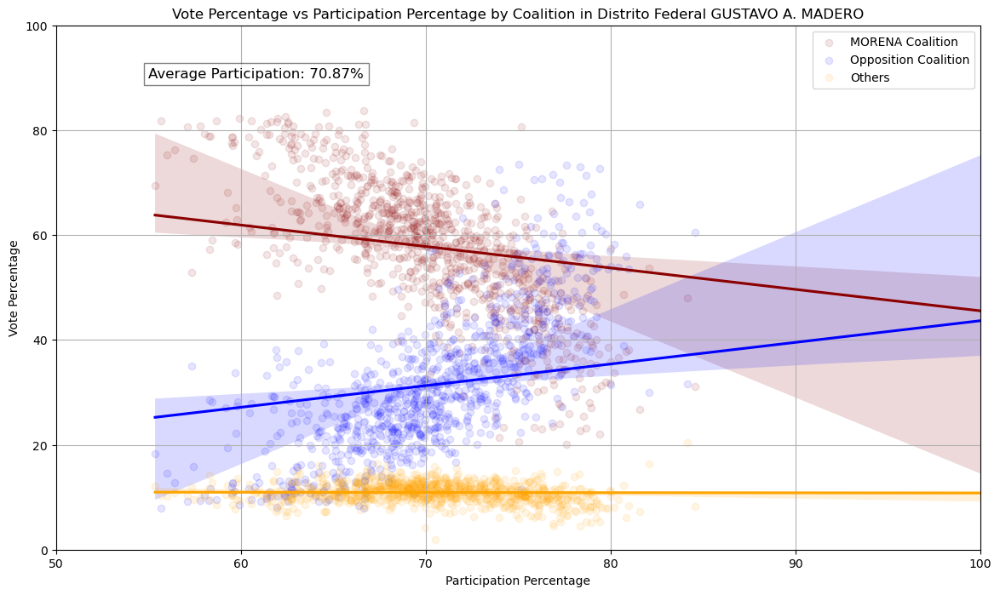

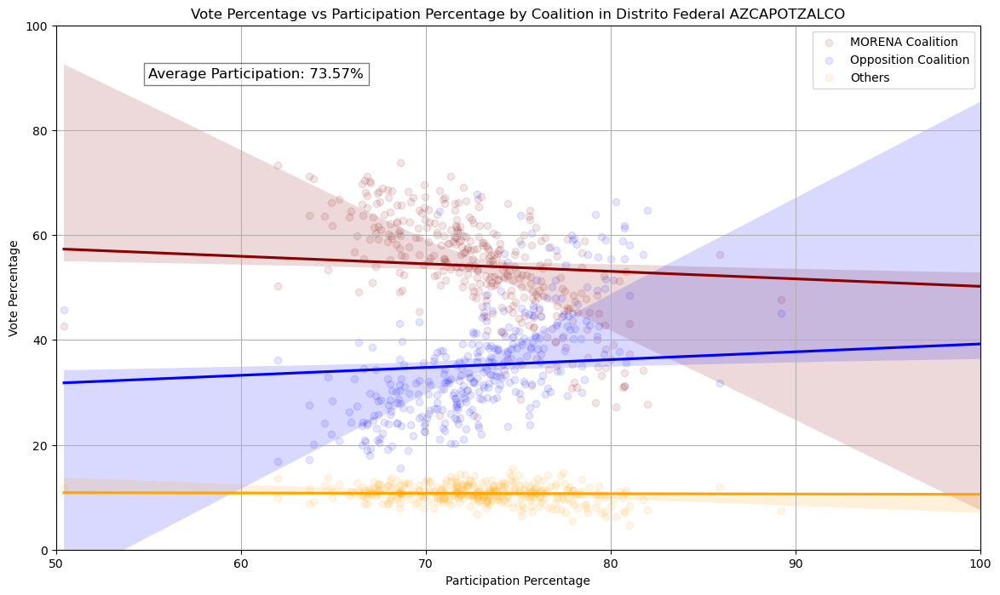

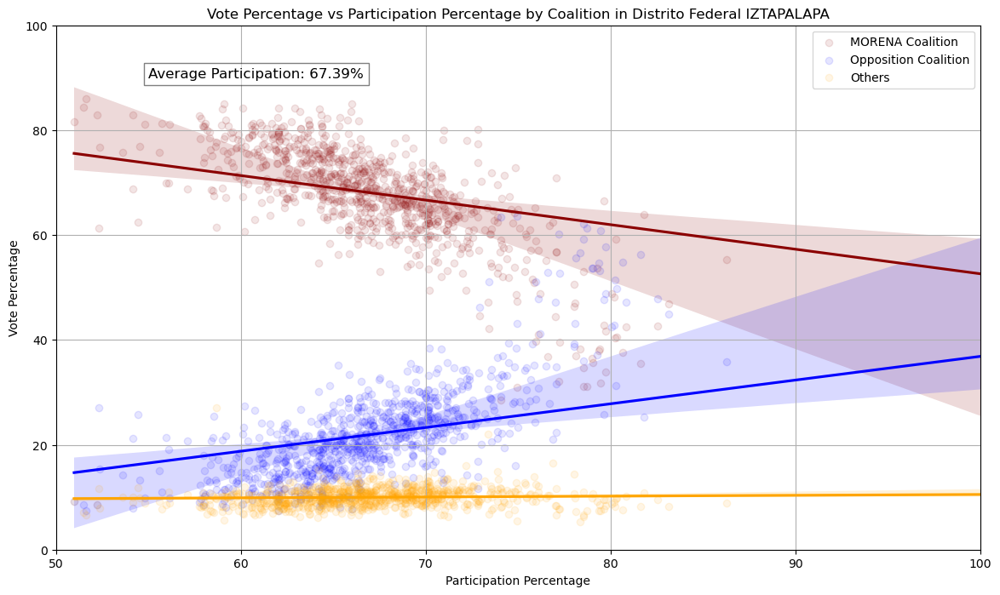

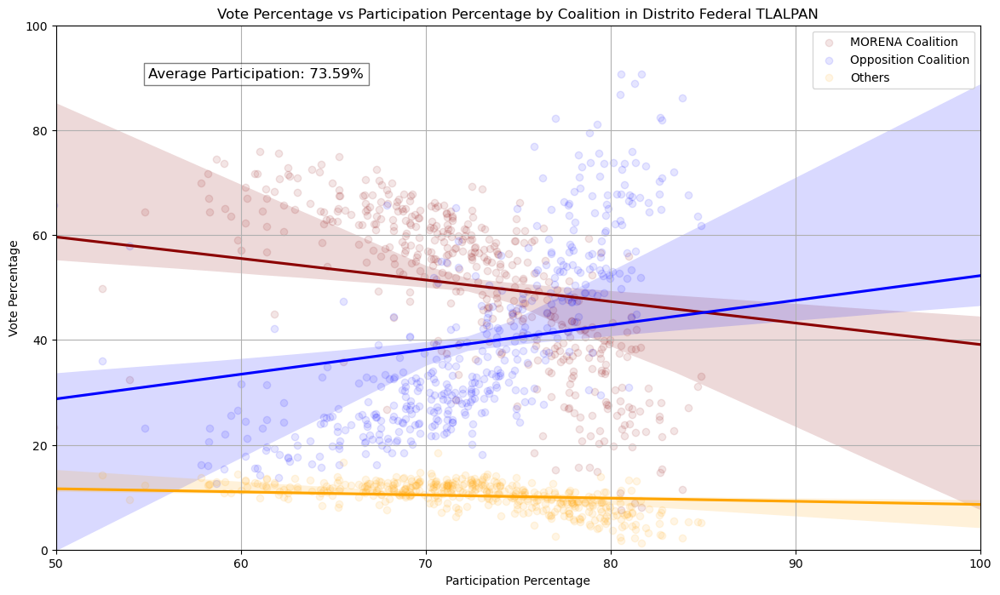

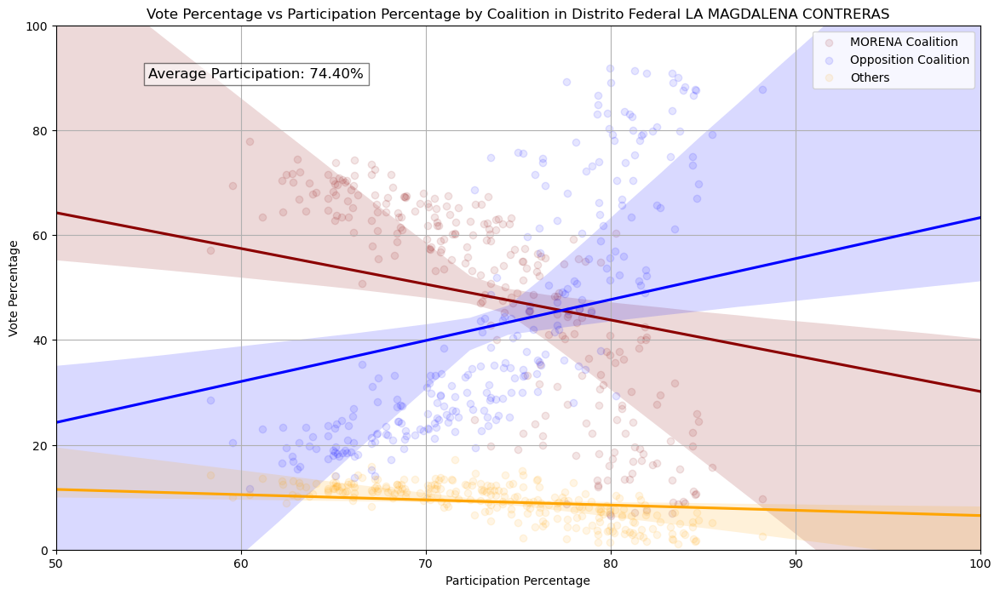

...

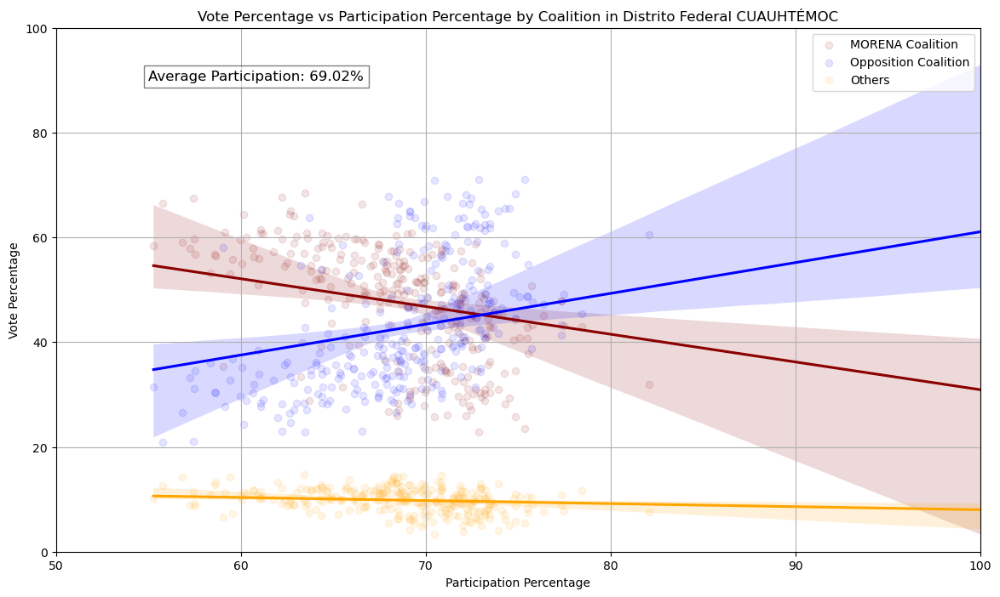

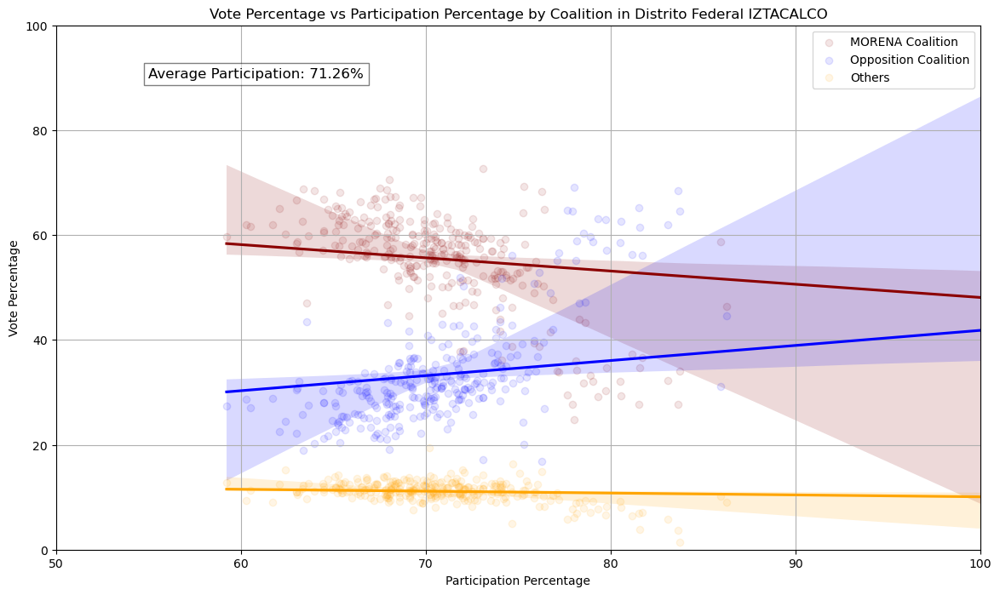

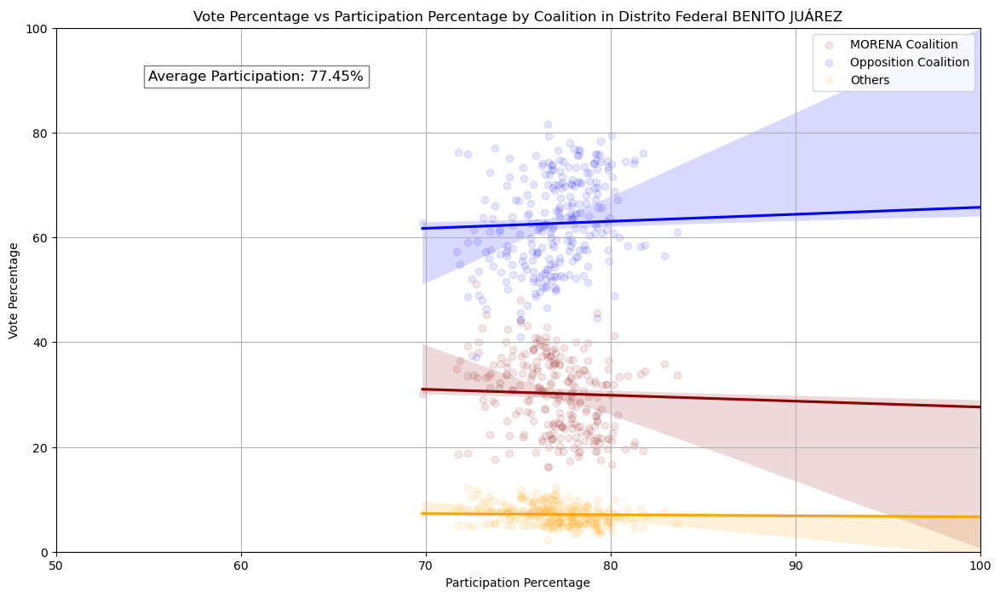

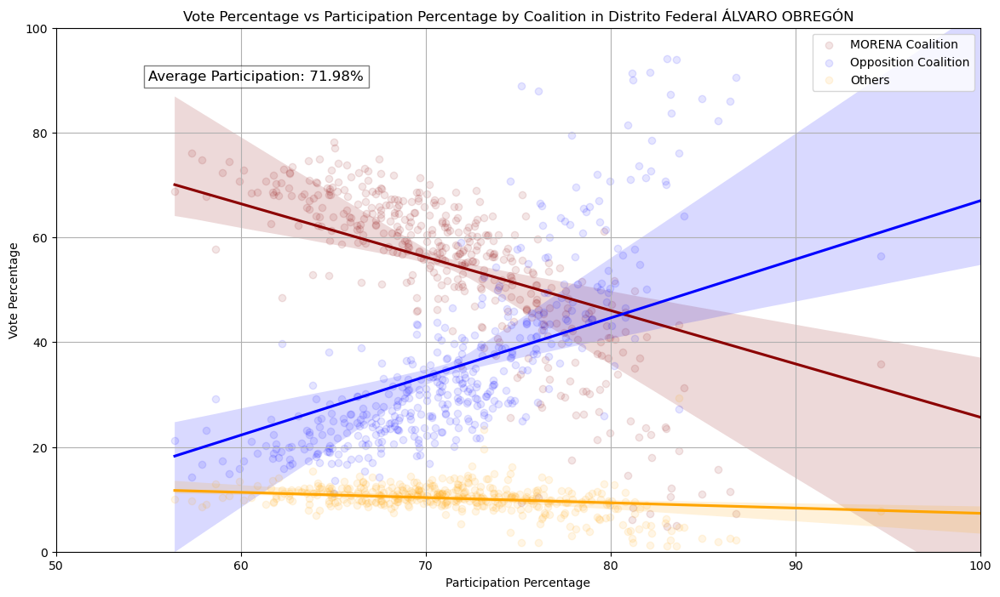

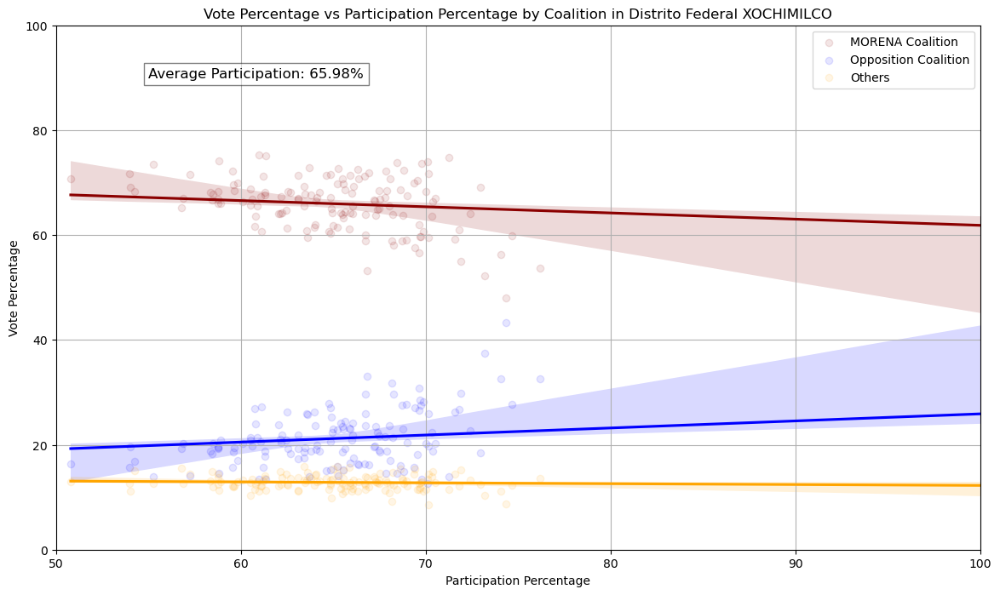

In [25]:
# Ensure DISTRITO_FEDERAL is in the data
if 'DISTRITO_FEDERAL' in aggregated_data.columns:
    unique_distritos = aggregated_data['DISTRITO_FEDERAL'].unique()

    for distrito in unique_distritos:
        subset_data = aggregated_data[aggregated_data['DISTRITO_FEDERAL'] == distrito]
        avg_participation = subset_data['PARTICIPATION_PERCENTAGE'].mean()

        plt.figure(figsize=(14, 8))

        # MORENA Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='MORENA_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'darkred', 'alpha': 0.1}, line_kws={'color': 'darkred'}, label='MORENA Coalition')

        # Opposition Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OPPOSITION_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'blue', 'alpha': 0.1}, line_kws={'color': 'blue'}, label='Opposition Coalition')

        # Others
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OTHERS_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'orange', 'alpha': 0.1}, line_kws={'color': 'orange'}, label='Others')

        # Setting labels and title
        plt.xlabel('Participation Percentage')
        plt.ylabel('Vote Percentage')
        plt.title(f'Vote Percentage vs Participation Percentage by Coalition in Distrito Federal {distrito}')
        plt.xlim(50, 100)  # Start the x-axis at 50
        plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100

        # Add average participation percentage text to the plot
        plt.text(55, 90, f'Average Participation: {avg_participation:.2f}%', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

        plt.legend()
        plt.grid(True)

        # Display the plot
        plt.show()

else:
    print("Column 'DISTRITO_FEDERAL' not found in the dataset.")

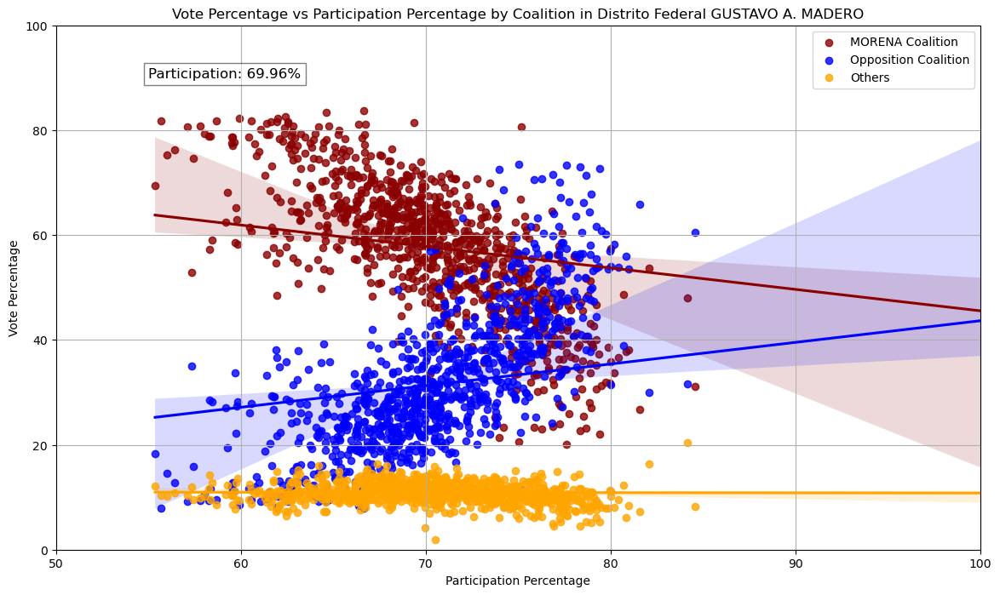

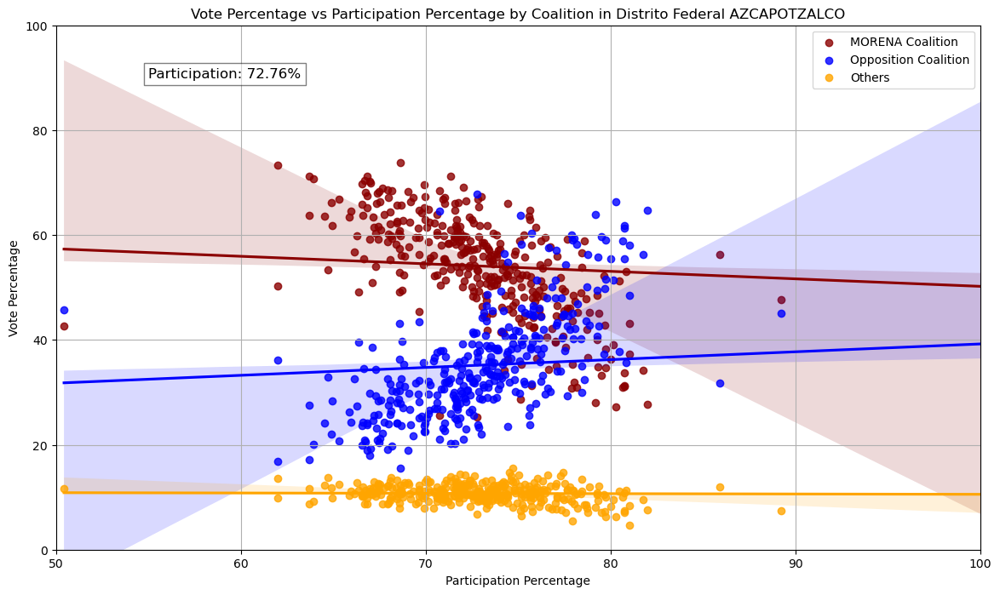

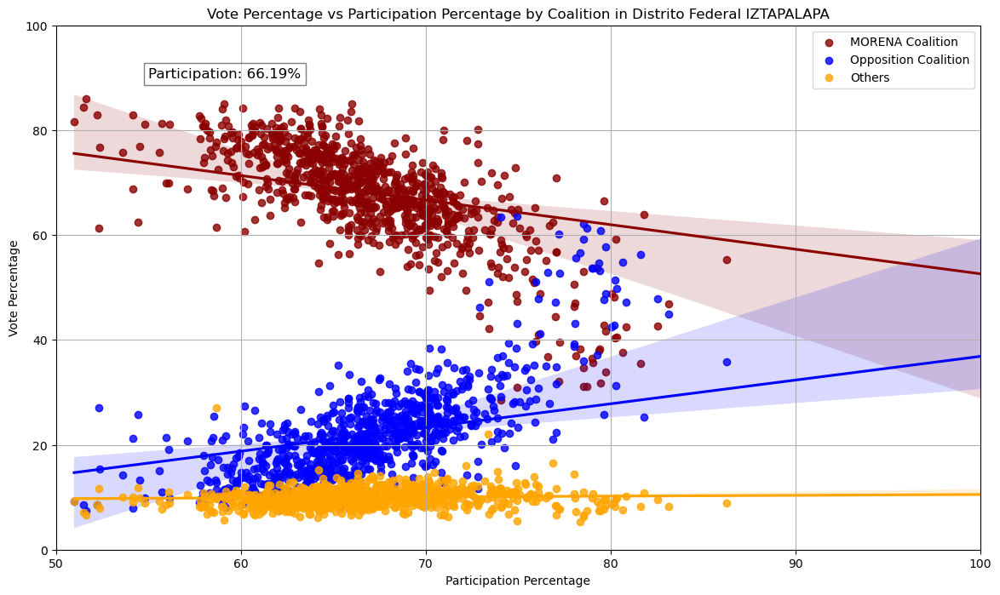

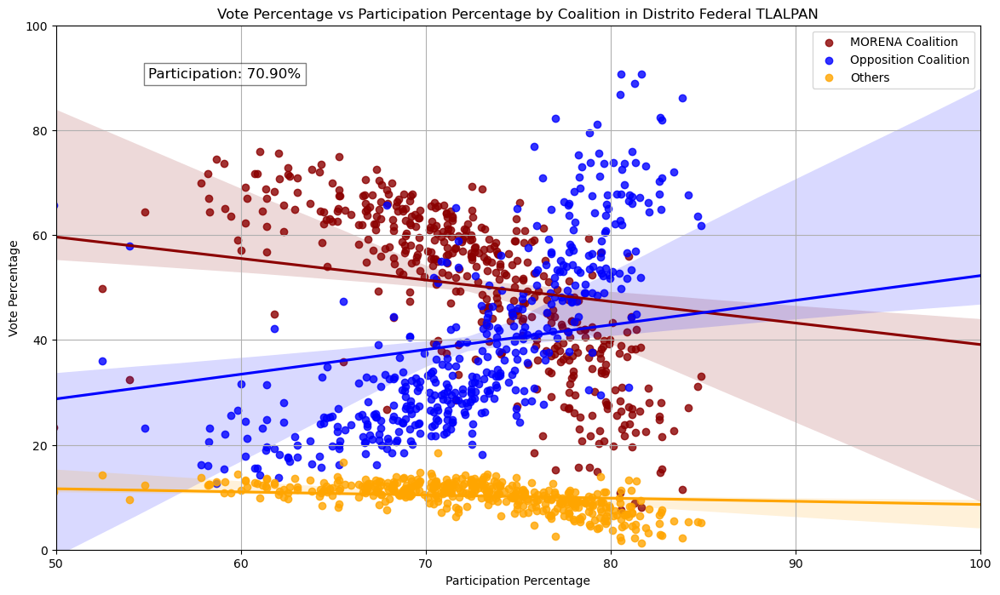

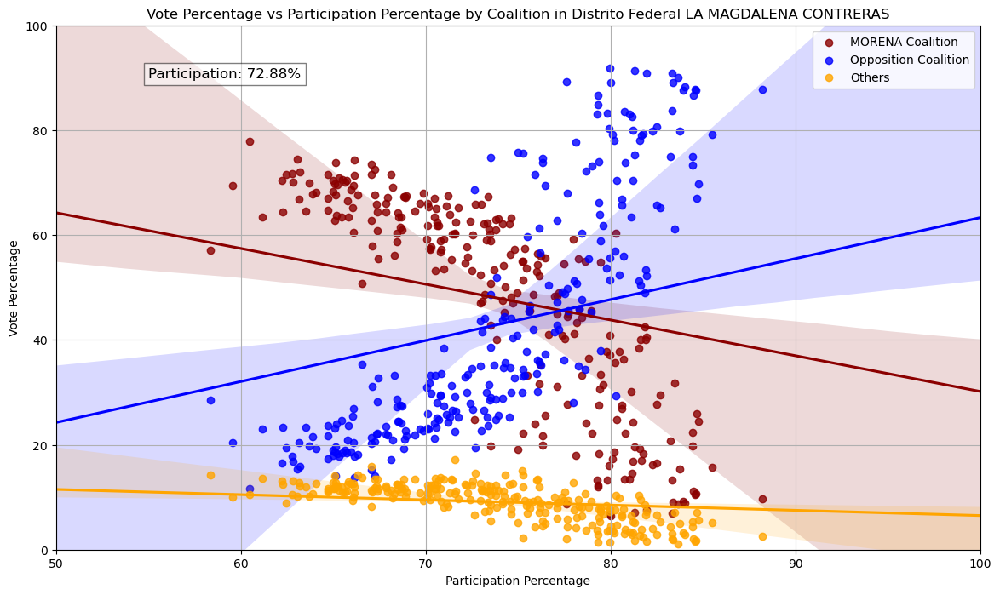

...

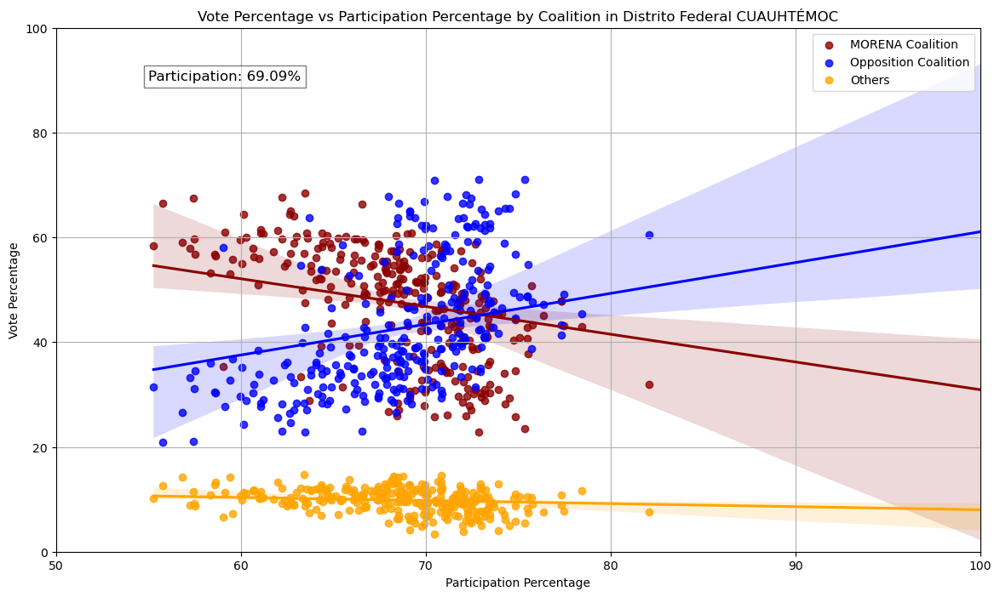

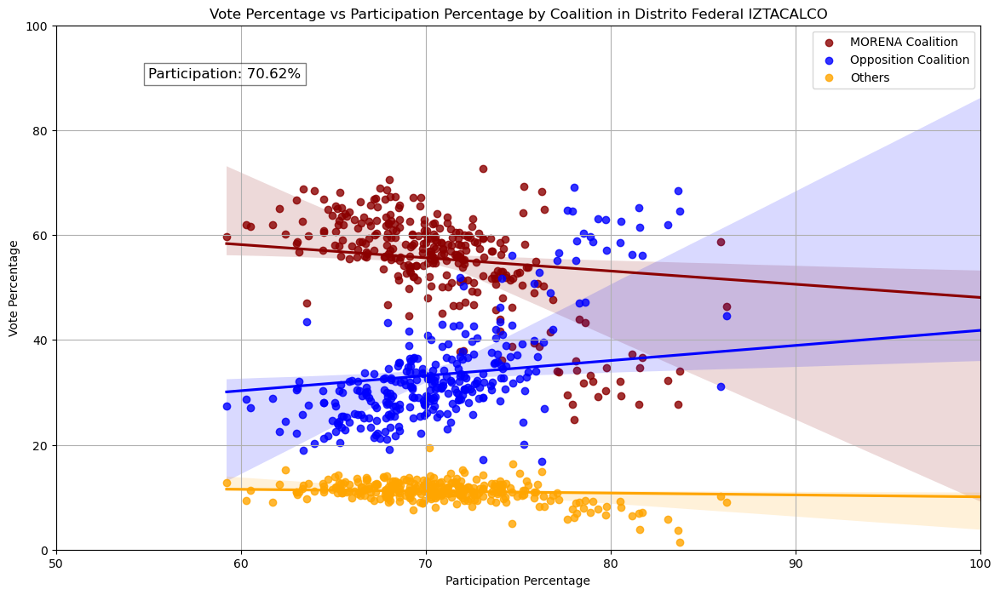

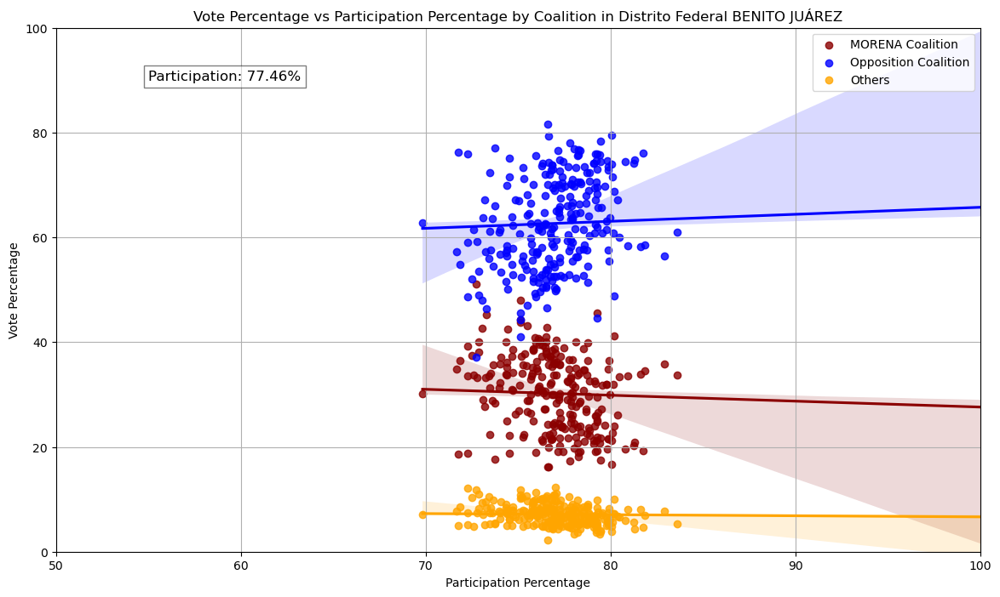

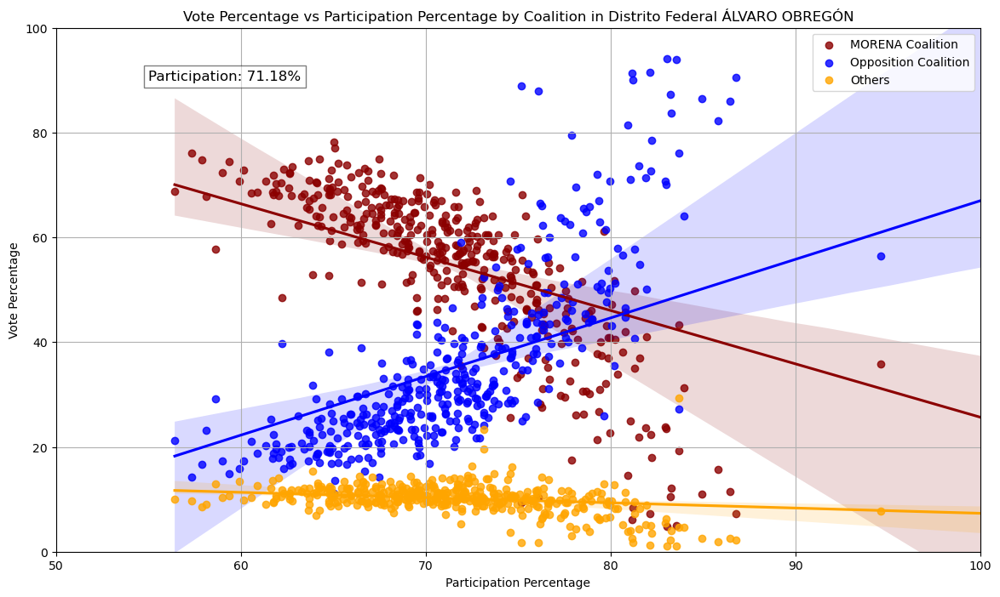

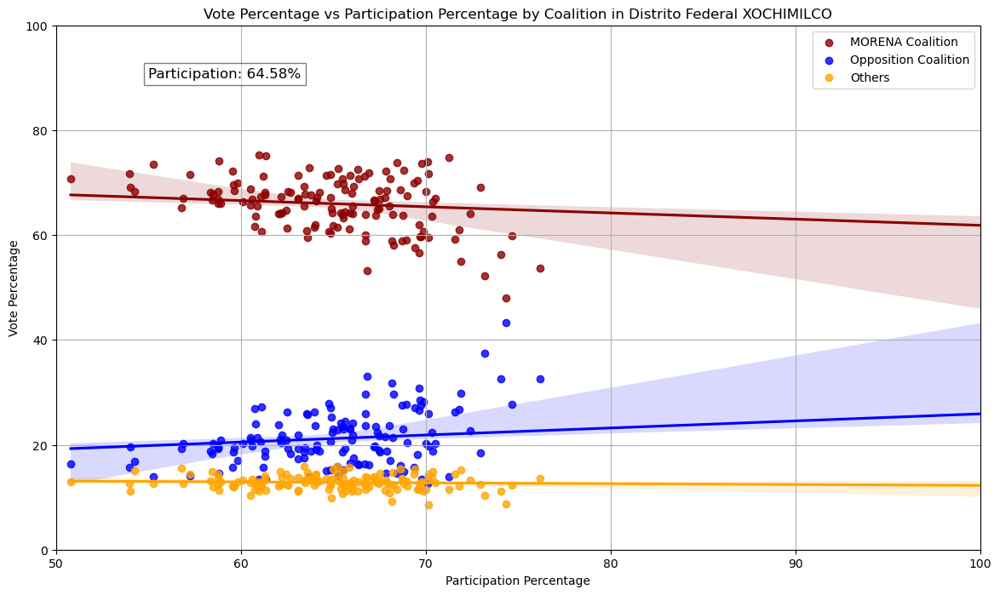

In [26]:

# Ensure DISTRITO_FEDERAL is in the data
if 'DISTRITO_FEDERAL' in aggregated_data.columns:
    unique_distritos = aggregated_data['DISTRITO_FEDERAL'].unique()

    for distrito in unique_distritos:
        subset_data = aggregated_data[aggregated_data['DISTRITO_FEDERAL'] == distrito]
        
        # Calculate PARTICIPATION_PERCENTAGE as the ratio of the sum of TOTAL_VOTOS_CALCULADOS to the sum of LISTA_NOMINAL
        total_votos_calculados_sum = subset_data['TOTAL_VOTOS_CALCULADOS'].sum()
        lista_nominal_sum = subset_data['LISTA_NOMINAL'].sum()
        participation_percentage = (total_votos_calculados_sum / lista_nominal_sum) * 100

        plt.figure(figsize=(14, 8))

        # MORENA Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='MORENA_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'darkred', 'alpha': 0.8}, line_kws={'color': 'darkred'}, label='MORENA Coalition')

        # Opposition Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OPPOSITION_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'blue', 'alpha': 0.8}, line_kws={'color': 'blue'}, label='Opposition Coalition')

        # Others
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OTHERS_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'orange', 'alpha': 0.8}, line_kws={'color': 'orange'}, label='Others')

        # Setting labels and title
        plt.xlabel('Participation Percentage')
        plt.ylabel('Vote Percentage')
        plt.title(f'Vote Percentage vs Participation Percentage by Coalition in Distrito Federal {distrito}')
        plt.xlim(50, 100)  # Start the x-axis at 50
        plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100

        # Add average participation percentage text to the plot
        plt.text(55, 90, f'Participation: {participation_percentage:.2f}%', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

        plt.legend()
        plt.grid(True)

        # Display the plot
        plt.show()

else:
    print("Column 'DISTRITO_FEDERAL' not found in the dataset.")

In [27]:
aggregated_data.head()

,ID_ENTIDAD,ENTIDAD,ID_DISTRITO_FEDERAL,DISTRITO_FEDERAL,SECCION,PVEM,PT,MORENA,PVEM_PT_MORENA,PVEM_PT,...,VOTOS NULOS,TOTAL_VOTOS_CALCULADOS,LISTA_NOMINAL,MORENA_COALITION_VOTES,OPPOSITION_COALITION_VOTES,OTHERS_VOTES,MORENA_COALITION_PERCENTAGE,OPPOSITION_COALITION_PERCENTAGE,OTHERS_PERCENTAGE,PARTICIPATION_PERCENTAGE
0,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,821,49,70,1064,130,7,...,36,1684,2719,1373,135,176,81.532067,8.016627,10.451306,61.934535
1,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,822,60,75,852,105,10,...,31,1394,2376,1141,133,120,81.850789,9.540890,8.608321,58.670034
2,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,823,59,76,973,99,5,...,26,1488,2233,1245,117,126,83.669355,7.862903,8.467742,66.636811
3,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,824,55,65,1078,86,13,...,26,1637,2666,1331,158,148,81.307269,9.651802,9.040929,61.402851
4,9,CIUDAD DE MÉXICO,1.0,GUSTAVO A. MADERO,825,37,55,718,55,9,...,17,1112,1603,906,118,88,81.474820,10.611511,7.913669,69.369931


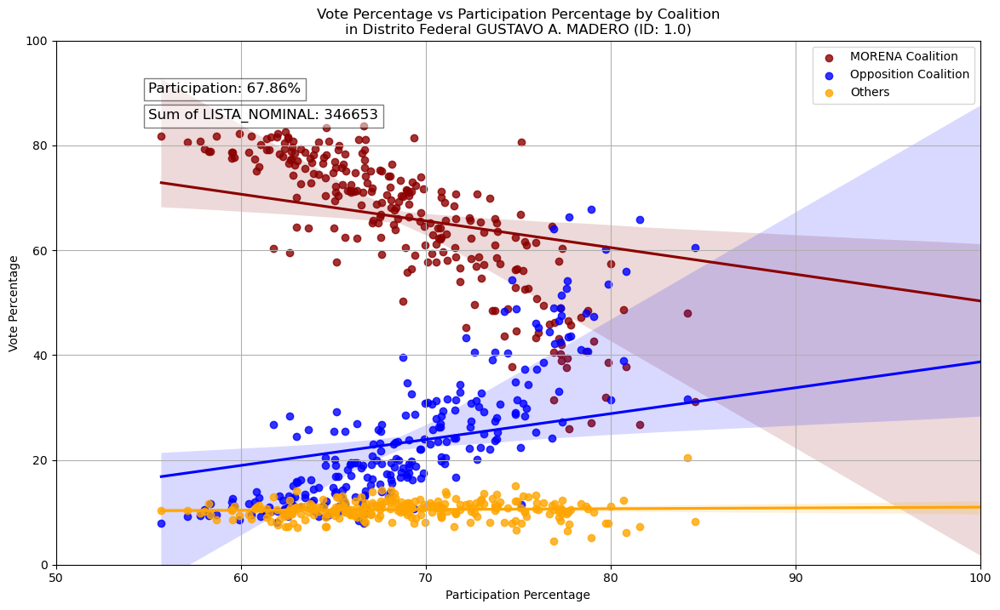

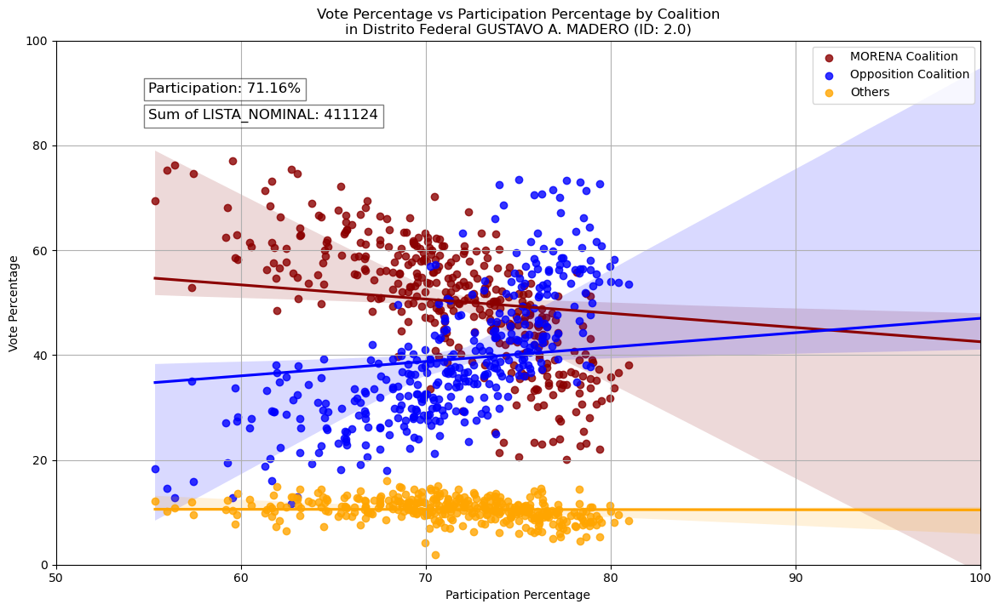

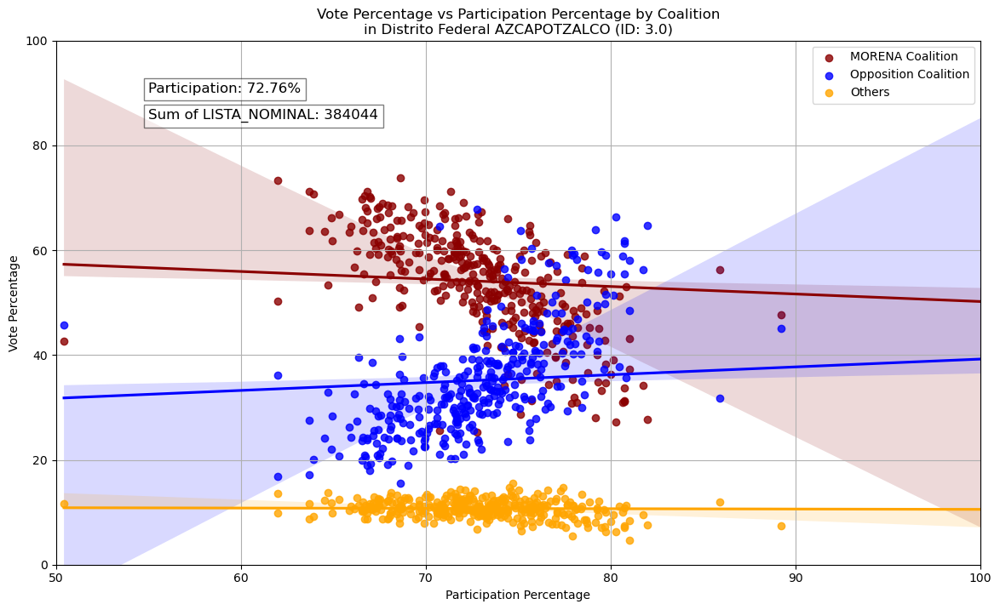

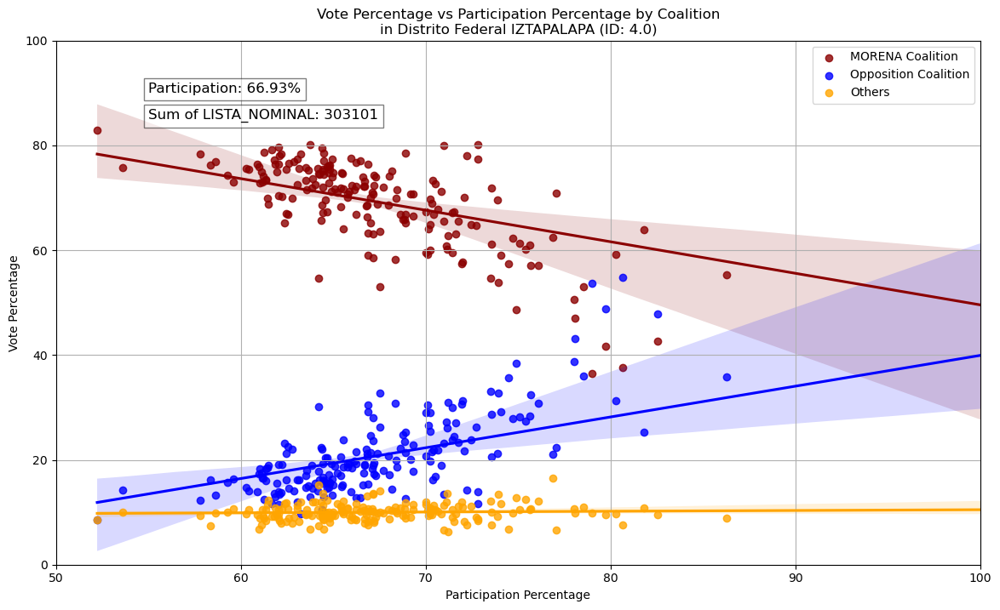

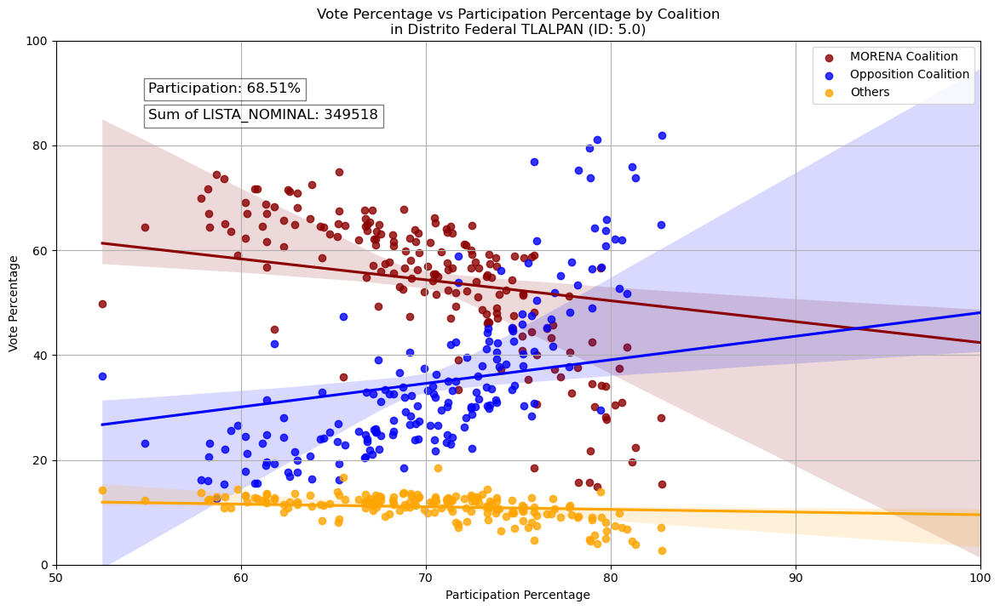

...

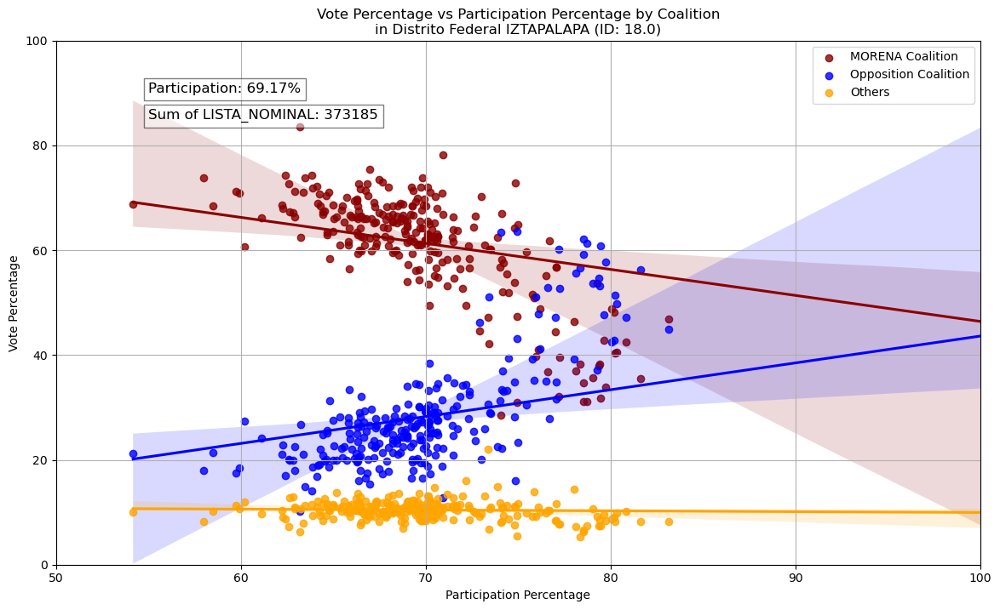

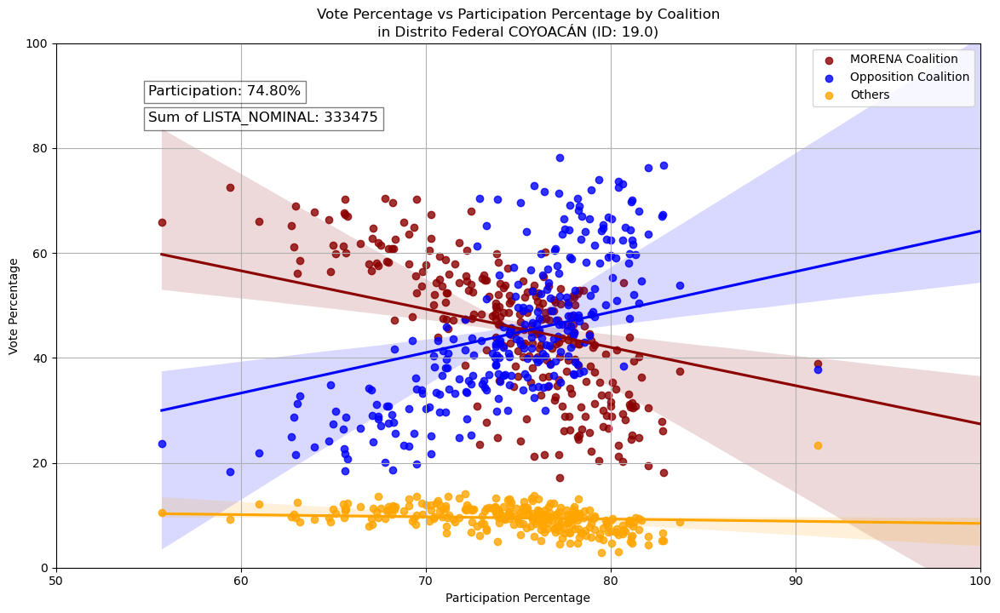

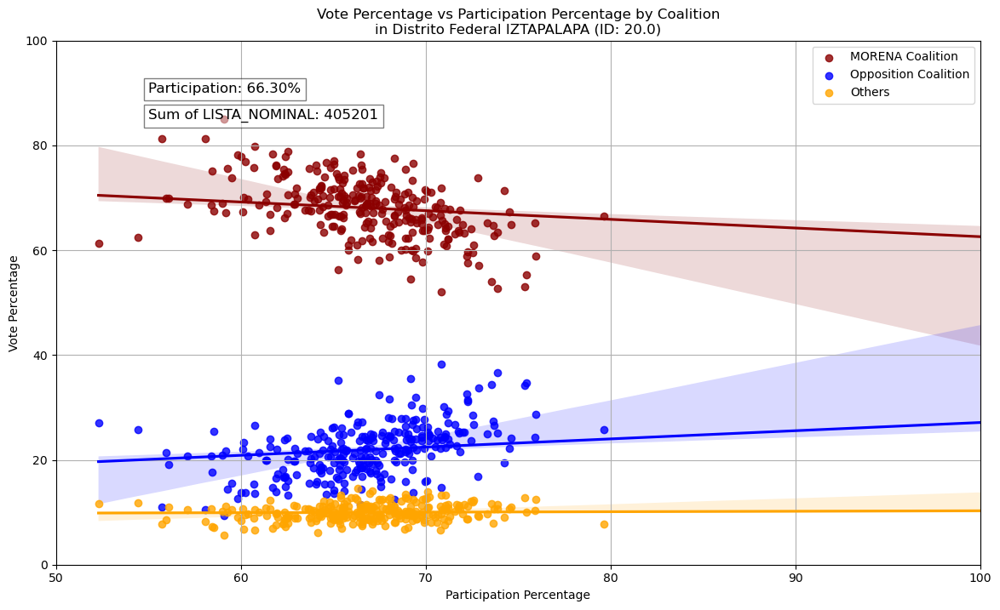

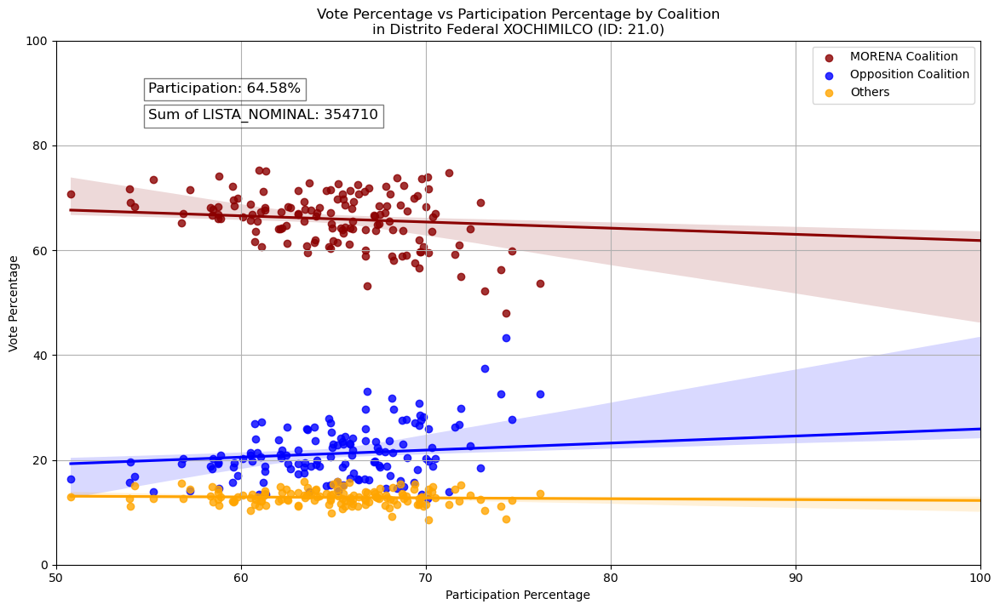

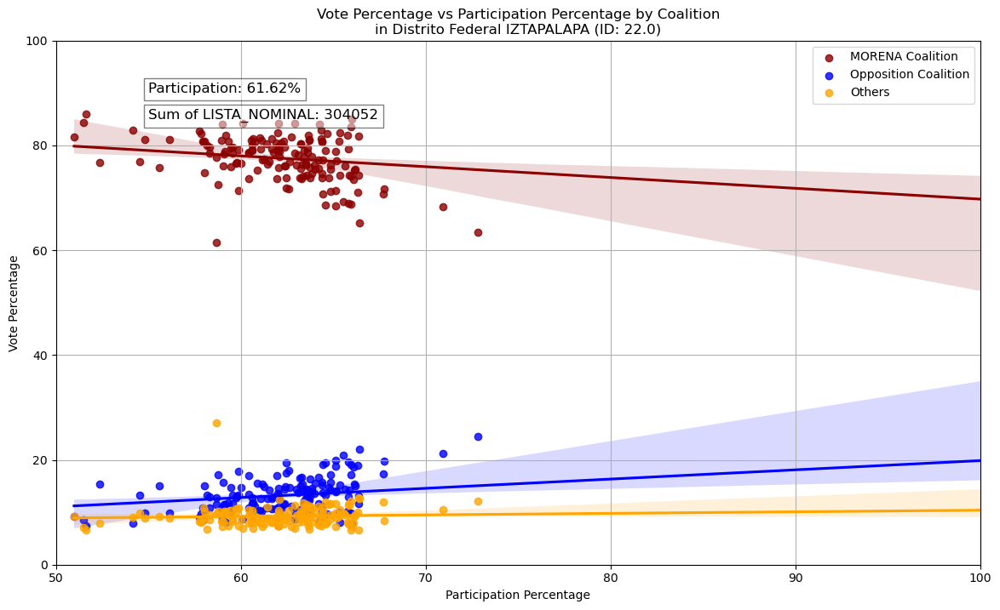

In [28]:
# Lo correcto es ID_Distrito Federal, después el nombre, es lo que determina los diputados federales, incluir suma de los votos
# Porcentajes de preferencia
# Análisis de tres partidos y el espacio que generan

if 'ID_DISTRITO_FEDERAL' in aggregated_data.columns and 'DISTRITO_FEDERAL' in aggregated_data.columns:
    unique_id_distritos = aggregated_data['ID_DISTRITO_FEDERAL'].unique()

    for id_distrito in unique_id_distritos:
        subset_data = aggregated_data[aggregated_data['ID_DISTRITO_FEDERAL'] == id_distrito]
        distrito_name = subset_data['DISTRITO_FEDERAL'].iloc[0]  # Assuming the name is the same within the same ID

        # Calculate PARTICIPATION_PERCENTAGE as the ratio of the sum of TOTAL_VOTOS_CALCULADOS to the sum of LISTA_NOMINAL
        total_votos_calculados_sum = subset_data['TOTAL_VOTOS_CALCULADOS'].sum()
        lista_nominal_sum = subset_data['LISTA_NOMINAL'].sum()
        participation_percentage = (total_votos_calculados_sum / lista_nominal_sum) * 100

        plt.figure(figsize=(14, 8))

        # MORENA Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='MORENA_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'darkred', 'alpha': 0.8}, line_kws={'color': 'darkred'}, label='MORENA Coalition')

        # Opposition Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OPPOSITION_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'blue', 'alpha': 0.8}, line_kws={'color': 'blue'}, label='Opposition Coalition')

        # Others
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OTHERS_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'orange', 'alpha': 0.8}, line_kws={'color': 'orange'}, label='Others')

        # Setting labels and title
        plt.xlabel('Participation Percentage')
        plt.ylabel('Vote Percentage')
        plt.title(f'Vote Percentage vs Participation Percentage by Coalition\nin Distrito Federal {distrito_name} (ID: {id_distrito})')
        plt.xlim(50, 100)  # Start the x-axis at 50
        plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100

        # Add participation percentage and sum of LISTA_NOMINAL to the plot
        plt.text(55, 90, f'Participation: {participation_percentage:.2f}%', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
        plt.text(55, 85, f'Sum of LISTA_NOMINAL: {lista_nominal_sum}', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

        plt.legend()
        plt.grid(True)

        # Display the plot
        plt.show()





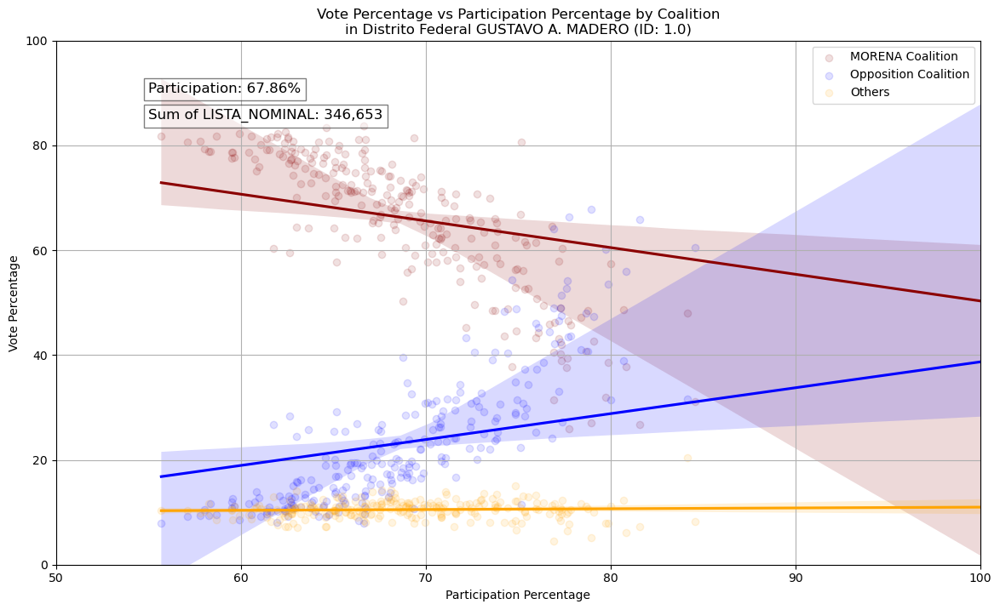

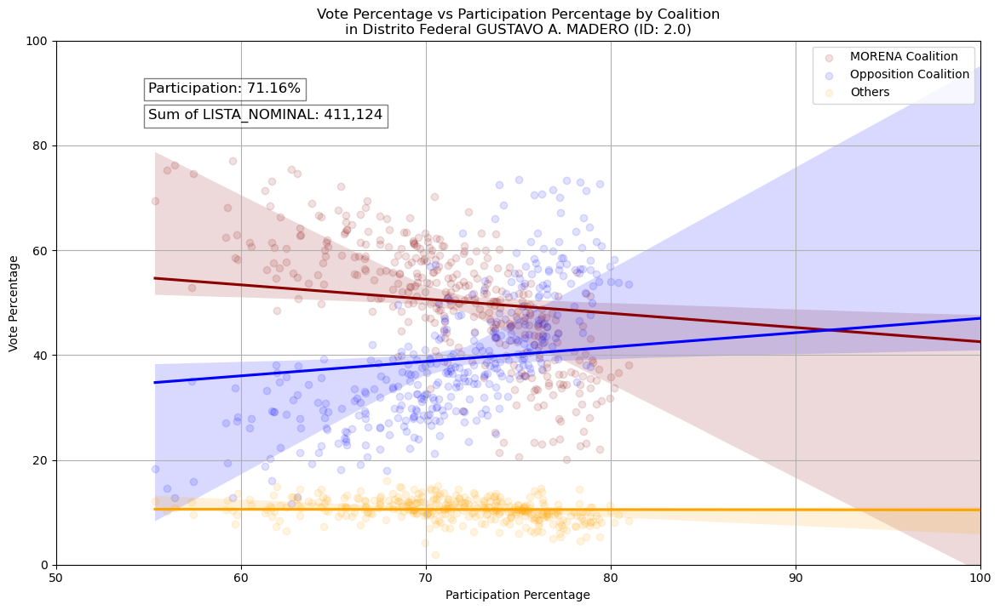

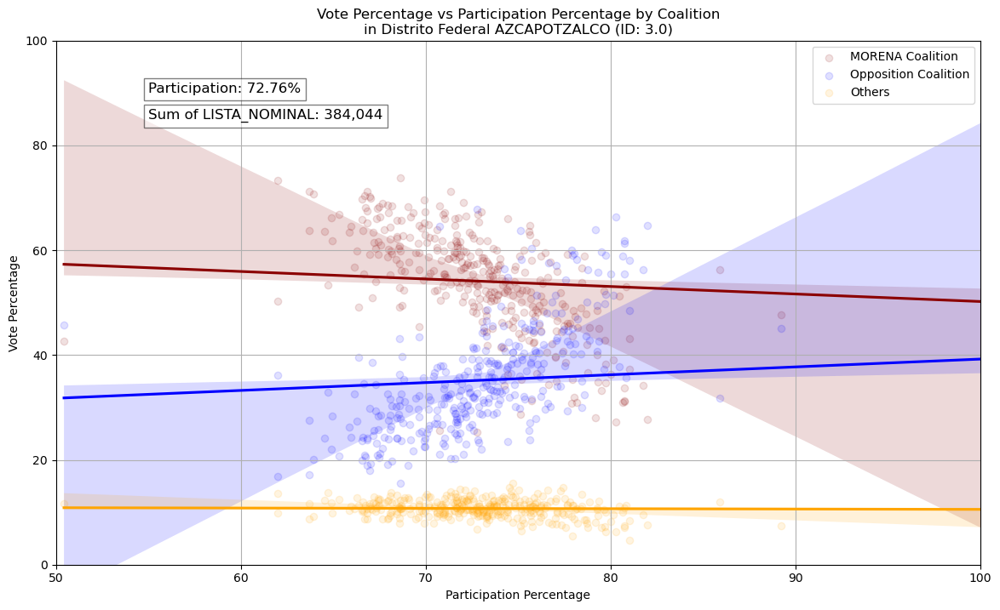

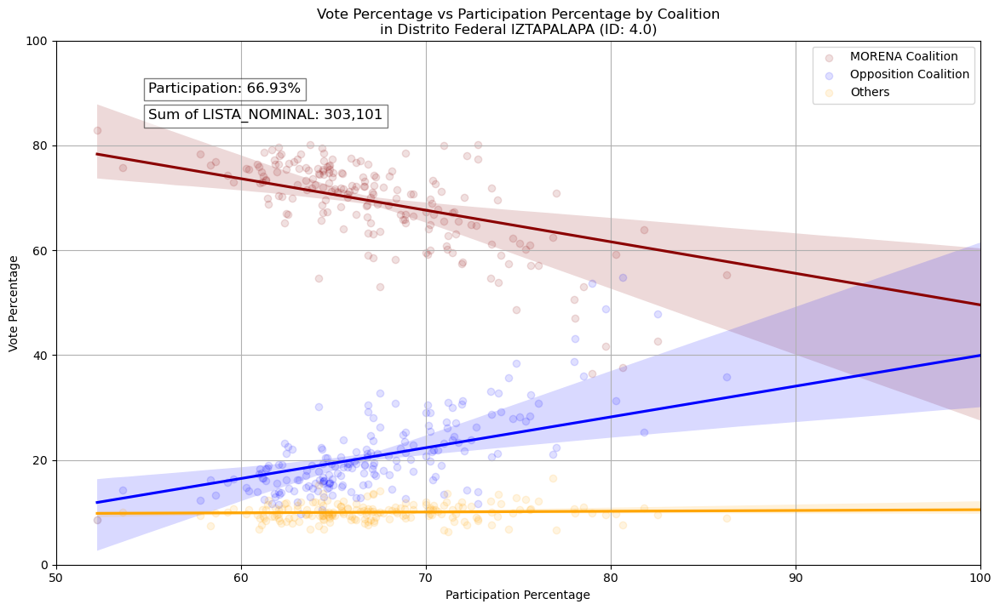

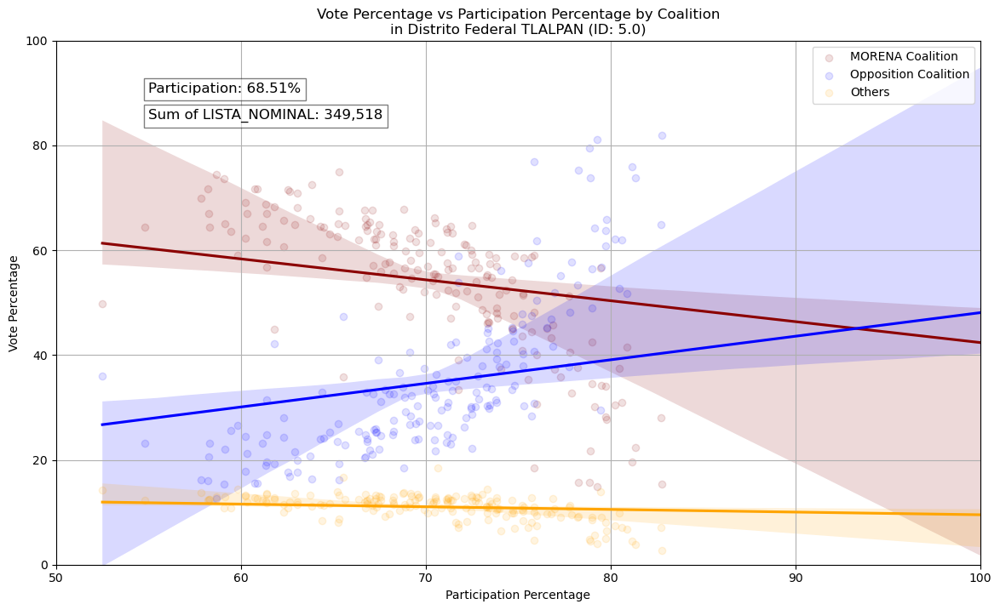

...

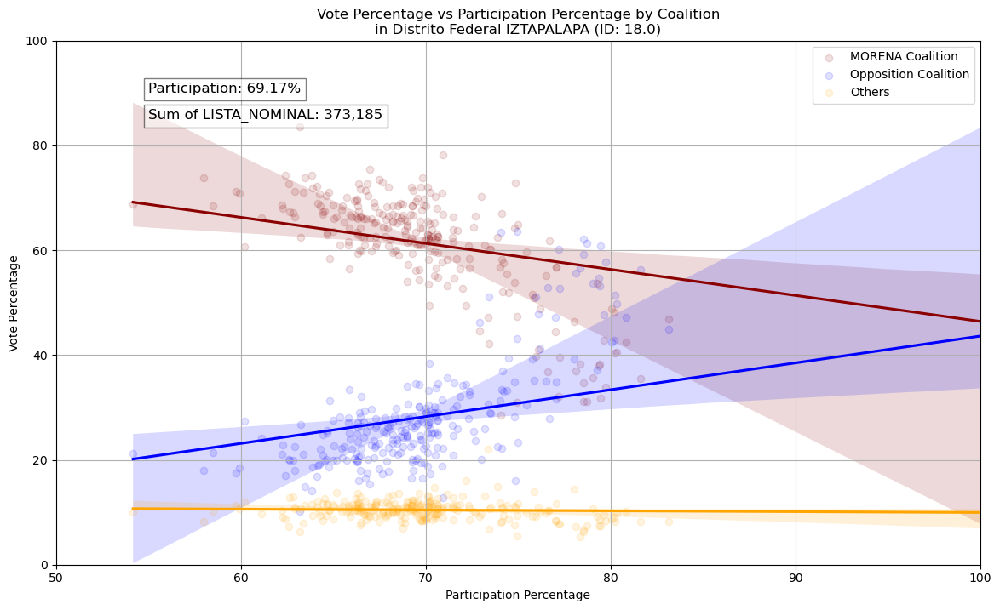

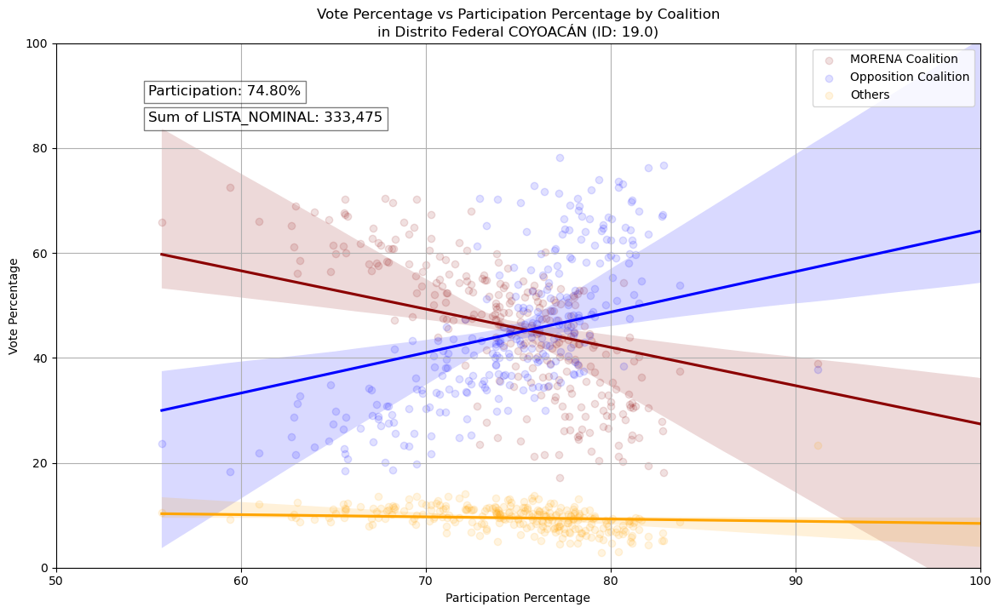

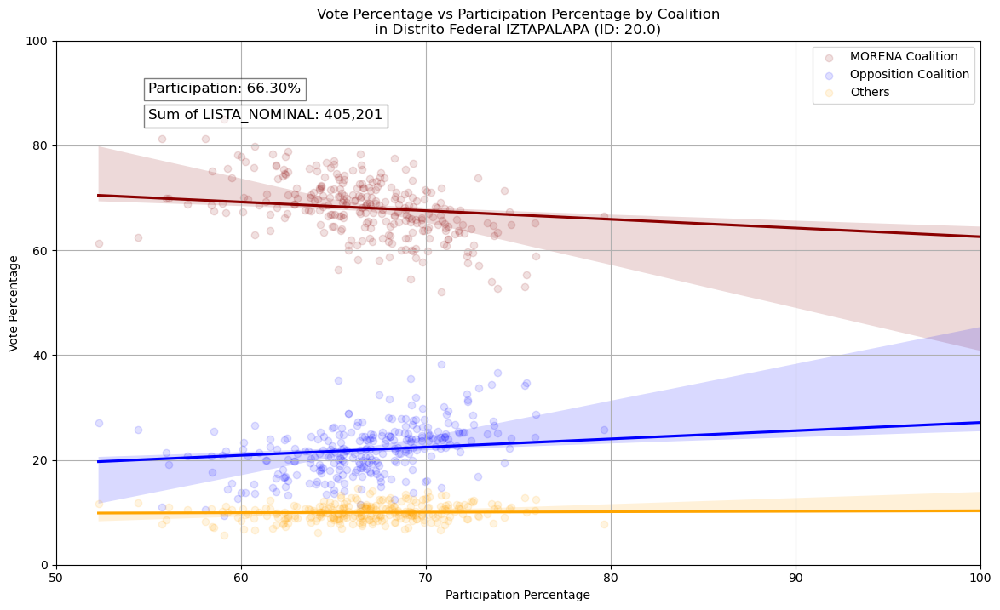

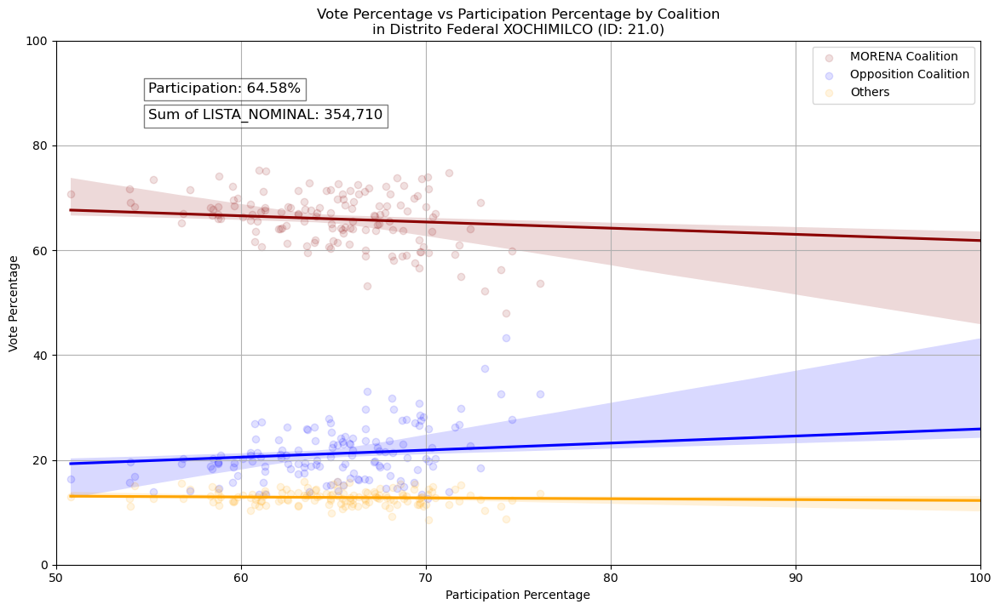

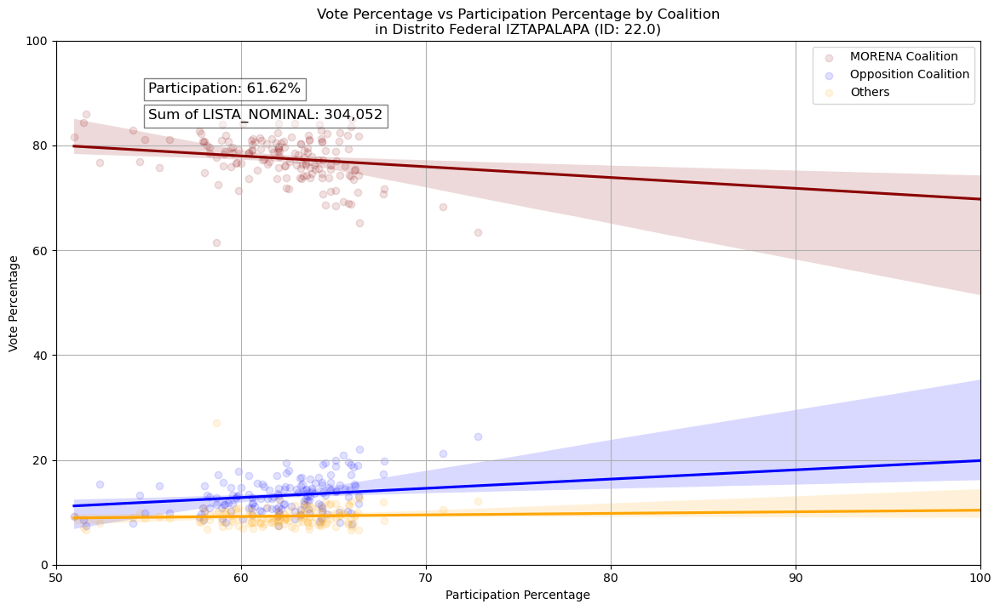

In [29]:
if 'ID_DISTRITO_FEDERAL' in aggregated_data.columns and 'DISTRITO_FEDERAL' in aggregated_data.columns:
    unique_id_distritos = aggregated_data['ID_DISTRITO_FEDERAL'].unique()

    for id_distrito in unique_id_distritos:
        subset_data = aggregated_data[aggregated_data['ID_DISTRITO_FEDERAL'] == id_distrito]
        distrito_name = subset_data['DISTRITO_FEDERAL'].iloc[0]  # Assuming the name is the same within the same ID

        # Calculate PARTICIPATION_PERCENTAGE as the ratio of the sum of TOTAL_VOTOS_CALCULADOS to the sum of LISTA_NOMINAL
        total_votos_calculados_sum = subset_data['TOTAL_VOTOS_CALCULADOS'].sum()
        lista_nominal_sum = subset_data['LISTA_NOMINAL'].sum()
        participation_percentage = (total_votos_calculados_sum / lista_nominal_sum) * 100

        plt.figure(figsize=(14, 8))

        # MORENA Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='MORENA_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'darkred', 'alpha': 0.12}, line_kws={'color': 'darkred'}, label='MORENA Coalition')

        # Opposition Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OPPOSITION_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'blue', 'alpha': 0.12}, line_kws={'color': 'blue'}, label='Opposition Coalition')

        # Others
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OTHERS_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'orange', 'alpha': 0.12}, line_kws={'color': 'orange'}, label='Others')

        # Setting labels and title
        plt.xlabel('Participation Percentage')
        plt.ylabel('Vote Percentage')
        plt.title(f'Vote Percentage vs Participation Percentage by Coalition\nin Distrito Federal {distrito_name} (ID: {id_distrito})')
        plt.xlim(50, 100)  # Start the x-axis at 50
        plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100

        # Add participation percentage and sum of LISTA_NOMINAL to the plot with comma-separated thousands
        plt.text(55, 90, f'Participation: {participation_percentage:.2f}%', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
        plt.text(55, 85, f'Sum of LISTA_NOMINAL: {lista_nominal_sum:,.0f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

        plt.legend()
        plt.grid(True)

        # Display the plot
        plt.show()

else:
    print("Columns 'ID_DISTRITO_FEDERAL' or 'DISTRITO_FEDERAL' not found in the dataset.")

In [35]:

# Ensure ID_DISTRITO_FEDERAL and DISTRITO_FEDERAL are in the data
if 'ID_DISTRITO_FEDERAL' in aggregated_data.columns and 'DISTRITO_FEDERAL' in aggregated_data.columns:
    unique_id_distritos = aggregated_data['ID_DISTRITO_FEDERAL'].unique()

    for id_distrito in unique_id_distritos:
        subset_data = aggregated_data[aggregated_data['ID_DISTRITO_FEDERAL'] == id_distrito]
        distrito_name = subset_data['DISTRITO_FEDERAL'].iloc[0]  # Assuming the name is the same within the same ID

        # Calculate PARTICIPATION_PERCENTAGE as the ratio of the sum of TOTAL_VOTOS_CALCULADOS to the sum of LISTA_NOMINAL
        total_votos_calculados_sum = subset_data['TOTAL_VOTOS_CALCULADOS'].sum()
        lista_nominal_sum = subset_data['LISTA_NOMINAL'].sum()
        participation_percentage = (total_votos_calculados_sum / lista_nominal_sum) * 100

        plt.figure(figsize=(14, 8))

        # MORENA Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='MORENA_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'darkred', 'alpha': 0.12}, line_kws={'color': 'darkred'}, label='MORENA Coalition')

        # Opposition Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OPPOSITION_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'blue', 'alpha': 0.12}, line_kws={'color': 'blue'}, label='Opposition Coalition')

        # Others
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OTHERS_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'orange', 'alpha': 0.12}, line_kws={'color': 'orange'}, label='Others')

        # Setting labels and title
        plt.xlabel('Participation Percentage')
        plt.ylabel('Vote Percentage')
        plt.title(f'Vote Percentage vs Participation Percentage by Coalition\nin Distrito Federal {distrito_name} (ID: {id_distrito})')
        plt.xlim(50, 100)  # Start the x-axis at 50
        plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100

        # Add participation percentage and sum of LISTA_NOMINAL to the plot with comma-separated thousands
        plt.text(55, 90, f'Participation: {participation_percentage:.2f}%', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
        plt.text(55, 85, f'Sum of LISTA_NOMINAL: {lista_nominal_sum:,.0f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

        plt.legend()
        plt.grid(True)

        # Save the plot
        output_file_path = f'C:/Proyectos/Elecciones-2024/plots/Vote_Percentage_vs_Participation_Cdmx{id_distrito}.png'
        plt.savefig(output_file_path, dpi=300, bbox_inches='tight')
        plt.close()

        print(f'Saved plot for ID_DISTRITO_FEDERAL {id_distrito} at {output_file_path}')

else:
    print("Columns 'ID_DISTRITO_FEDERAL' or 'DISTRITO_FEDERAL' not found in the dataset.")

Saved plot for ID_DISTRITO_FEDERAL 1.0 at C:/Proyectos/Elecciones-2024/plots/Vote_Percentage_vs_Participation_Cdmx1.0.png
Saved plot for ID_DISTRITO_FEDERAL 2.0 at C:/Proyectos/Elecciones-2024/plots/Vote_Percentage_vs_Participation_Cdmx2.0.png
Saved plot for ID_DISTRITO_FEDERAL 3.0 at C:/Proyectos/Elecciones-2024/plots/Vote_Percentage_vs_Participation_Cdmx3.0.png
Saved plot for ID_DISTRITO_FEDERAL 4.0 at C:/Proyectos/Elecciones-2024/plots/Vote_Percentage_vs_Participation_Cdmx4.0.png
Saved plot for ID_DISTRITO_FEDERAL 5.0 at C:/Proyectos/Elecciones-2024/plots/Vote_Percentage_vs_Participation_Cdmx5.0.png
Saved plot for ID_DISTRITO_FEDERAL 6.0 at C:/Proyectos/Elecciones-2024/plots/Vote_Percentage_vs_Participation_Cdmx6.0.png
Saved plot for ID_DISTRITO_FEDERAL 7.0 at C:/Proyectos/Elecciones-2024/plots/Vote_Percentage_vs_Participation_Cdmx7.0.png
Saved plot for ID_DISTRITO_FEDERAL 8.0 at C:/Proyectos/Elecciones-2024/plots/Vote_Percentage_vs_Participation_Cdmx8.0.png
Saved plot for ID_DISTRI

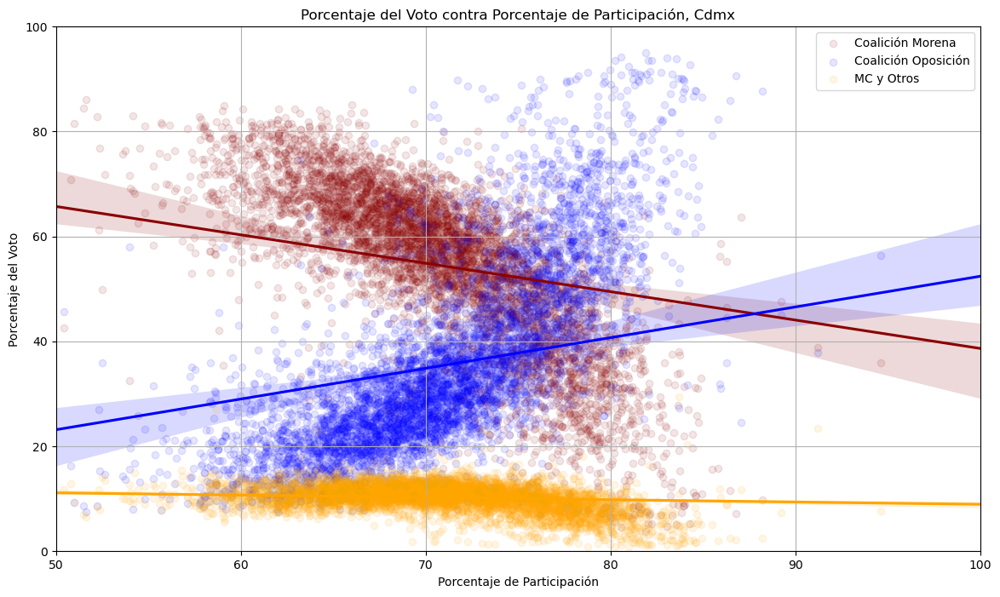

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


# Calculate PARTICIPATION_PERCENTAGE as the ratio of the sum of TOTAL_VOTOS_CALCULADOS to the sum of LISTA_NOMINAL for the entire dataset
total_votos_calculados_sum = aggregated_data['TOTAL_VOTOS_CALCULADOS'].sum()
lista_nominal_sum = aggregated_data['LISTA_NOMINAL'].sum()
participation_percentage = (total_votos_calculados_sum / lista_nominal_sum) * 100

plt.figure(figsize=(14, 8))

# MORENA Coalition
sns.regplot(x='PARTICIPATION_PERCENTAGE', y='MORENA_COALITION_PERCENTAGE', data=aggregated_data,
            scatter_kws={'color': 'darkred', 'alpha': 0.1}, line_kws={'color': 'darkred'}, label='Coalición Morena')

# Opposition Coalition
sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OPPOSITION_COALITION_PERCENTAGE', data=aggregated_data,
            scatter_kws={'color': 'blue', 'alpha': 0.1}, line_kws={'color': 'blue'}, label='Coalición Oposición')

# Others
sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OTHERS_PERCENTAGE', data=aggregated_data,
            scatter_kws={'color': 'orange', 'alpha': 0.1}, line_kws={'color': 'orange'}, label='MC y Otros')

# Setting labels and title
plt.xlabel('Porcentaje de Participación')
plt.ylabel('Porcentaje del Voto')
plt.title('Porcentaje del Voto contra Porcentaje de Participación, Cdmx')
plt.xlim(50, 100)  # Start the x-axis at 50
plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100

# Add participation percentage and sum of LISTA_NOMINAL to the plot with comma-separated thousands
#plt.text(55, 90, f'Participation: {participation_percentage:.2f}%', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
#plt.text(55, 85, f'Sum of LISTA_NOMINAL: {lista_nominal_sum:,.0f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

plt.legend()
plt.grid(True)

# Save the plot
#output_file_path = 'C:/Proyectos/Elecciones-2024/plots/Vote_Percentage_vs_Participation_All_Data.png'
#plt.savefig(output_file_path, dpi=300, bbox_inches='tight')
#plt.close()

#print(f'Saved plot for all data at {output_file_path}')

In [41]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from jinja2 import Environment, FileSystemLoader


# Ensure the plots directory exists
plots_dir = 'C:/Proyectos/Elecciones-2024/plots'
os.makedirs(plots_dir, exist_ok=True)

# Ensure ID_DISTRITO_FEDERAL and DISTRITO_FEDERAL are in the data
if 'ID_DISTRITO_FEDERAL' in aggregated_data.columns and 'DISTRITO_FEDERAL' in aggregated_data.columns:
    unique_id_distritos = aggregated_data['ID_DISTRITO_FEDERAL'].unique()
    plot_file_paths = []

    for id_distrito in unique_id_distritos:
        subset_data = aggregated_data[aggregated_data['ID_DISTRITO_FEDERAL'] == id_distrito]
        distrito_name = subset_data['DISTRITO_FEDERAL'].iloc[0]  # Assuming the name is the same within the same ID

        # Calculate PARTICIPATION_PERCENTAGE as the ratio of the sum of TOTAL_VOTOS_CALCULADOS to the sum of LISTA_NOMINAL
        total_votos_calculados_sum = subset_data['TOTAL_VOTOS_CALCULADOS'].sum()
        lista_nominal_sum = subset_data['LISTA_NOMINAL'].sum()
        participation_percentage = (total_votos_calculados_sum / lista_nominal_sum) * 100

        plt.figure(figsize=(14, 8))

        # MORENA Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='MORENA_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'darkred', 'alpha': 0.12}, line_kws={'color': 'darkred'}, label='MORENA Coalition')

        # Opposition Coalition
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OPPOSITION_COALITION_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'blue', 'alpha': 0.12}, line_kws={'color': 'blue'}, label='Opposition Coalition')

        # Others
        sns.regplot(x='PARTICIPATION_PERCENTAGE', y='OTHERS_PERCENTAGE', data=subset_data,
                    scatter_kws={'color': 'orange', 'alpha': 0.12}, line_kws={'color': 'orange'}, label='Others')

        # Setting labels and title
        plt.xlabel('Participation Percentage')
        plt.ylabel('Vote Percentage')
        plt.title(f'Vote Percentage vs Participation Percentage by Coalition\nin Distrito Federal {distrito_name} (ID: {id_distrito})')
        plt.xlim(50, 100)  # Start the x-axis at 50
        plt.ylim(0, 100)  # Ensure the y-axis ranges from 0 to 100

        # Add participation percentage and sum of LISTA_NOMINAL to the plot with comma-separated thousands
        plt.text(55, 90, f'Participation: {participation_percentage:.2f}%', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
        plt.text(55, 85, f'Sum of LISTA_NOMINAL: {lista_nominal_sum:,.0f}', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

        plt.legend()
        plt.grid(True)

        # Save the plot
        plot_file_path = os.path.join(plots_dir, f'Vote_Percentage_vs_Participation_{id_distrito}.png')
        plt.savefig(plot_file_path, dpi=300, bbox_inches='tight')
        plt.close()

        plot_file_paths.append({
            'id_distrito': id_distrito,
            'distrito_name': distrito_name,
            'file_path': plot_file_path
        })

        print(f'Saved plot for ID_DISTRITO_FEDERAL {id_distrito} at {plot_file_path}')

else:
    print("Columns 'ID_DISTRITO_FEDERAL' or 'DISTRITO_FEDERAL' not found in the dataset.")

# Generate the HTML content
env = Environment(loader=FileSystemLoader('.'))
template = env.get_template('template.html')

html_content = template.render(plots=plot_file_paths)

# Save the HTML content to a file
output_html_path = 'C:/Proyectos/Elecciones-2024/plots/index.html'
with open(output_html_path, 'w') as f:
    f.write(html_content)

print(f'Saved HTML file at {output_html_path}')


Saved plot for ID_DISTRITO_FEDERAL 1.0 at C:/Proyectos/Elecciones-2024/plots\Vote_Percentage_vs_Participation_1.0.png
Saved plot for ID_DISTRITO_FEDERAL 2.0 at C:/Proyectos/Elecciones-2024/plots\Vote_Percentage_vs_Participation_2.0.png
Saved plot for ID_DISTRITO_FEDERAL 3.0 at C:/Proyectos/Elecciones-2024/plots\Vote_Percentage_vs_Participation_3.0.png
Saved plot for ID_DISTRITO_FEDERAL 4.0 at C:/Proyectos/Elecciones-2024/plots\Vote_Percentage_vs_Participation_4.0.png
Saved plot for ID_DISTRITO_FEDERAL 5.0 at C:/Proyectos/Elecciones-2024/plots\Vote_Percentage_vs_Participation_5.0.png
Saved plot for ID_DISTRITO_FEDERAL 6.0 at C:/Proyectos/Elecciones-2024/plots\Vote_Percentage_vs_Participation_6.0.png
Saved plot for ID_DISTRITO_FEDERAL 7.0 at C:/Proyectos/Elecciones-2024/plots\Vote_Percentage_vs_Participation_7.0.png
Saved plot for ID_DISTRITO_FEDERAL 8.0 at C:/Proyectos/Elecciones-2024/plots\Vote_Percentage_vs_Participation_8.0.png
Saved plot for ID_DISTRITO_FEDERAL 9.0 at C:/Proyectos/E

TemplateNotFound: template.html